#### Course 201: Data Analytics with Python

# Scenario

You are a data analyst working with the UK government to analyse COVID-19 data (from January 2020 to October 2021). As part of their goal to increase the number of fully vaccinated individuals (people who have received a first and second dose of the vaccine), the government is planning to launch a series of marketing campaigns to promote the vaccine. The government wants to identify trends and patterns that can be used to inform their marketing approach to increase the number of fully vaccinated people.

You are expected to analyse the data to identify patterns and trends that could help inform their marketing strategy to promote the vaccine and ultimately increase the vaccination rate. The government would like to understand:

- What the total vaccinations are for a particular region
- Where they should target the first marketing campaign(s) based on: area(s) with the largest number of people who have received a first dose but no second dose; which area has the greatest number of recoveries so that they can avoid this area in their initial campaign runs; whether deaths have been increasing across all regions over time or if a peak has been reached
- What other types of Twitter data points and tweets have both #coronavirus and #vaccinated hashtags
- Which regions have experienced a peak in hospitalisation numbers and if there are regions that have not reached a peak yet
- If there are interesting points in time where different regions displayed unique behaviour patterns
- Potential future outcomes based on trends in the hospitalisation rates of different regions

# 0) Environment preparation

In [1]:
# Import the required libraries and set plotting options
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(rc = {'figure.figsize':(15,10)})

# 1) Assignment activity 1: [Prepare your GitHub repository](https://fourthrev.instructure.com/courses/313/pages/assignment-activity-1-prepare-your-github-repository?module_item_id=20647)

#### Insert URL to your public GitHub repository and a screenshot 
- [My Github Repo](https://github.com/mhbilas/LSE_DA_COVID_analysis)

#### Describe the role and how workflow tools such as Github can be used to add value to organisations.

- Facilitates work in teams
- Version control: allows you and other team members to unro or roll back changes without causing any issues
- Ideal for collaborating with others and establishing a clear and reversible change history
- Tried and trusted place for housing code, controlling changes over time, learning from and with others, and building a portfolio of work
- Repo helps to keep work organised
- Sandbox allows you to experiment and learn from your mistakes
- Hosting explorations helps you improve your skills faster by getting valuable feedback from others
- Build and maintain a knowledge bank of code, projects, and programs
- Popular and respected way to share and showcase work with colleagues and potential employers as part of your portfolio

# 2) Assignment activity 2: [Import and explore data](https://fourthrev.instructure.com/courses/313/pages/assignment-activity-2-import-and-explore-the-data?module_item_id=20648)

#### 2.1) Report expectations:
- Load the files `covid_19_uk_cases.csv` and `covid_19_uk_vaccinated.csv` and explore the data.
- Explore the data using the `info()`, `describe()`, `shape` and `value_counts()` methods, and note the observations regarding data types, number or records and features
- Identify missing data
- Filter/subset data
- Aggregate data (totals and by month)
- Note observations

## Load the covid cases and vaccine data sets as cov and vac respectively

In [2]:
cov = pd.read_csv("covid_19_uk_cases.csv")
vac = pd.read_csv("covid_19_uk_vaccinated.csv")

## Explore the DataFrames with the appropriate functions

In [3]:
# Explore the cov data set - rows and columns
print(cov.shape)

(7584, 12)


In [4]:
# Explore the cov data set - variable info
print(cov.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7584 entries, 0 to 7583
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Province/State            7584 non-null   object 
 1   Country/Region            7584 non-null   object 
 2   Lat                       7584 non-null   float64
 3   Long                      7584 non-null   float64
 4   ISO 3166-1 Alpha 3-Codes  7584 non-null   object 
 5   Sub-region Name           7584 non-null   object 
 6   Intermediate Region Code  7584 non-null   int64  
 7   Date                      7584 non-null   object 
 8   Deaths                    7582 non-null   float64
 9   Cases                     7582 non-null   float64
 10  Recovered                 7582 non-null   float64
 11  Hospitalised              7582 non-null   float64
dtypes: float64(6), int64(1), object(5)
memory usage: 711.1+ KB
None


In [5]:
# Explore the cov data set - values
print(cov.value_counts())

Province/State            Country/Region  Lat        Long        ISO 3166-1 Alpha 3-Codes  Sub-region Name                  Intermediate Region Code  Date        Deaths  Cases   Recovered  Hospitalised
Anguilla                  United Kingdom  18.220600  -63.068600  AIA                       Latin America and the Caribbean  29                        2020-01-22  0.0     0.0     0.0        0.0             1
Isle of Man               United Kingdom  54.236100  -4.548100   IMN                       Northern Europe                  0                         2021-10-11  54.0    8121.0  0.0        631.0           1
Montserrat                United Kingdom  16.742498  -62.187366  MSR                       Latin America and the Caribbean  29                        2020-01-30  0.0     0.0     0.0        0.0             1
                                                                                                                                                      2020-01-29  0.0     0.0    

In [6]:
# Explore the cov data set - statistics
print(cov.describe())

               Lat         Long  Intermediate Region Code         Deaths  \
count  7584.000000  7584.000000               7584.000000    7582.000000   
mean     21.840267   -41.440047                 12.500000    6210.202321   
std      28.305518    30.527529                 14.009849   24860.790148   
min     -51.796300   -81.254600                  0.000000       0.000000   
25%      17.851075   -64.667625                  0.000000       0.000000   
50%      20.503650   -60.855483                  2.500000       1.000000   
75%      39.448675    -5.152225                 29.000000      25.000000   
max      55.378100    -2.364400                 29.000000  138237.000000   

              Cases    Recovered  Hospitalised  
count  7.582000e+03  7582.000000   7582.000000  
mean   2.147082e+05   454.691242    685.228568  
std    1.007557e+06  1010.642337    819.256635  
min    0.000000e+00     0.000000      0.000000  
25%    1.200000e+01     0.000000    105.000000  
50%    1.685000e+02  

In [7]:
# Explore the cov data set - rows and columns
print(vac.shape)

(7584, 11)


In [8]:
# Explore the cov data set - variable info
print(vac.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7584 entries, 0 to 7583
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Province/State            7584 non-null   object 
 1   Country/Region            7584 non-null   object 
 2   Lat                       7584 non-null   float64
 3   Long                      7584 non-null   float64
 4   ISO 3166-1 Alpha 3-Codes  7584 non-null   object 
 5   Sub-region Name           7584 non-null   object 
 6   Intermediate Region Code  7584 non-null   int64  
 7   Date                      7584 non-null   object 
 8   Vaccinated                7584 non-null   int64  
 9   First Dose                7584 non-null   int64  
 10  Second Dose               7584 non-null   int64  
dtypes: float64(2), int64(4), object(5)
memory usage: 651.9+ KB
None


In [9]:
# Explore the cov data set - values
print(vac.value_counts())

Province/State            Country/Region  Lat        Long        ISO 3166-1 Alpha 3-Codes  Sub-region Name                  Intermediate Region Code  Date        Vaccinated  First Dose  Second Dose
Anguilla                  United Kingdom  18.220600  -63.068600  AIA                       Latin America and the Caribbean  29                        2020-01-22  0           0           0              1
Isle of Man               United Kingdom  54.236100  -4.548100   IMN                       Northern Europe                  0                         2021-10-10  1751        1990        1751           1
Montserrat                United Kingdom  16.742498  -62.187366  MSR                       Latin America and the Caribbean  29                        2020-01-29  0           0           0              1
                                                                                                                                                      2020-01-28  0           0           0      

In [10]:
# Explore the cov data set - statistics
print(vac.describe())

               Lat         Long  Intermediate Region Code    Vaccinated  \
count  7584.000000  7584.000000               7584.000000   7584.000000   
mean     21.840267   -41.440047                 12.500000   5913.547600   
std      28.305518    30.527529                 14.009849  10846.410258   
min     -51.796300   -81.254600                  0.000000      0.000000   
25%      17.851075   -64.667625                  0.000000      0.000000   
50%      20.503650   -60.855483                  2.500000      0.000000   
75%      39.448675    -5.152225                 29.000000   8338.000000   
max      55.378100    -2.364400                 29.000000  69619.000000   

         First Dose   Second Dose  
count   7584.000000   7584.000000  
mean    6192.822257   5913.547600  
std    11439.883647  10846.410258  
min        0.000000      0.000000  
25%        0.000000      0.000000  
50%        0.000000      0.000000  
75%     7505.500000   8338.000000  
max    94038.000000  69619.000000  


## Identify missing data

In [11]:
# Identify missing data in cov data set
# Note: missing data can be identified through the info() method used above
# Another method for identifying missing data is through the isnull() method used below
print(f"Number of missing values for Province/State: {cov['Province/State'].isnull().sum()}")
print(f"Number of missing values for Country/Region: {cov['Country/Region'].isnull().sum()}")
print(f"Number of missing values for Lat: {cov['Lat'].isnull().sum()}")
print(f"Number of missing values for Long: {cov['Long'].isnull().sum()}")
print(f"Number of missing values for ISO codes: {cov['ISO 3166-1 Alpha 3-Codes'].isnull().sum()}")
print(f"Number of missing values for Sub-region: {cov['Sub-region Name'].isnull().sum()}")
print(f"Number of missing values for Intermediate Region code: {cov['Intermediate Region Code'].isnull().sum()}")
print(f"Number of missing values for Date: {cov['Date'].isnull().sum()}")
print(f"Number of missing values for Deaths: {cov['Deaths'].isnull().sum()}")
print(f"Number of missing values for Cases: {cov['Cases'].isnull().sum()}")
print(f"Number of missing values for Recovered: {cov['Recovered'].isnull().sum()}")
print(f"Number of missing values for Hospitalised: {cov['Hospitalised'].isnull().sum()}")

Number of missing values for Province/State: 0
Number of missing values for Country/Region: 0
Number of missing values for Lat: 0
Number of missing values for Long: 0
Number of missing values for ISO codes: 0
Number of missing values for Sub-region: 0
Number of missing values for Intermediate Region code: 0
Number of missing values for Date: 0
Number of missing values for Deaths: 2
Number of missing values for Cases: 2
Number of missing values for Recovered: 2
Number of missing values for Hospitalised: 2


In [12]:
# Identify missing data in vac data set
# Note: missing data can be identified through the info() method used above
# Another method for identifying missing data is through the isnull() method used below
print(f"Number of missing values for Province/State: {vac['Province/State'].isnull().sum()}")
print(f"Number of missing values for Country/Region: {vac['Country/Region'].isnull().sum()}")
print(f"Number of missing values for Lat: {vac['Lat'].isnull().sum()}")
print(f"Number of missing values for Long: {vac['Long'].isnull().sum()}")
print(f"Number of missing values for ISO codes: {vac['ISO 3166-1 Alpha 3-Codes'].isnull().sum()}")
print(f"Number of missing values for Sub-region: {vac['Sub-region Name'].isnull().sum()}")
print(f"Number of missing values for Intermediate Region code: {vac['Intermediate Region Code'].isnull().sum()}")
print(f"Number of missing values for Date: {vac['Date'].isnull().sum()}")
print(f"Number of missing values for Vaccinated: {vac['Vaccinated'].isnull().sum()}")
print(f"Number of missing values for First Dose: {vac['First Dose'].isnull().sum()}")
print(f"Number of missing values for Second Dose: {vac['Second Dose'].isnull().sum()}")

Number of missing values for Province/State: 0
Number of missing values for Country/Region: 0
Number of missing values for Lat: 0
Number of missing values for Long: 0
Number of missing values for ISO codes: 0
Number of missing values for Sub-region: 0
Number of missing values for Intermediate Region code: 0
Number of missing values for Date: 0
Number of missing values for Vaccinated: 0
Number of missing values for First Dose: 0
Number of missing values for Second Dose: 0


## Create DataFrame based on Gibraltar data

In [13]:
# Merge cov and vac data
covid = pd.merge(cov, vac)
print(covid.shape)
print(covid.columns)

(7584, 15)
Index(['Province/State', 'Country/Region', 'Lat', 'Long',
       'ISO 3166-1 Alpha 3-Codes', 'Sub-region Name',
       'Intermediate Region Code', 'Date', 'Deaths', 'Cases', 'Recovered',
       'Hospitalised', 'Vaccinated', 'First Dose', 'Second Dose'],
      dtype='object')


In [14]:
# Filter for Gibraltar
gibraltar = covid[covid['Province/State'] == 'Gibraltar']
pd.set_option("display.max_rows", None)
gibraltar

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose
3792,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-22,0.0,0.0,0.0,0.0,0,0,0
3793,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-23,0.0,0.0,0.0,0.0,0,0,0
3794,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-24,0.0,0.0,0.0,0.0,0,0,0
3795,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-25,0.0,0.0,0.0,0.0,0,0,0
3796,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-26,0.0,0.0,0.0,0.0,0,0,0
3797,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-27,0.0,0.0,0.0,0.0,0,0,0
3798,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-28,0.0,0.0,0.0,0.0,0,0,0
3799,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-29,0.0,0.0,0.0,0.0,0,0,0
3800,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-30,0.0,0.0,0.0,0.0,0,0,0
3801,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-31,0.0,0.0,0.0,0.0,0,0,0


## Explore behaviour over time - all regions

<AxesSubplot:xlabel='Date', ylabel='Deaths'>

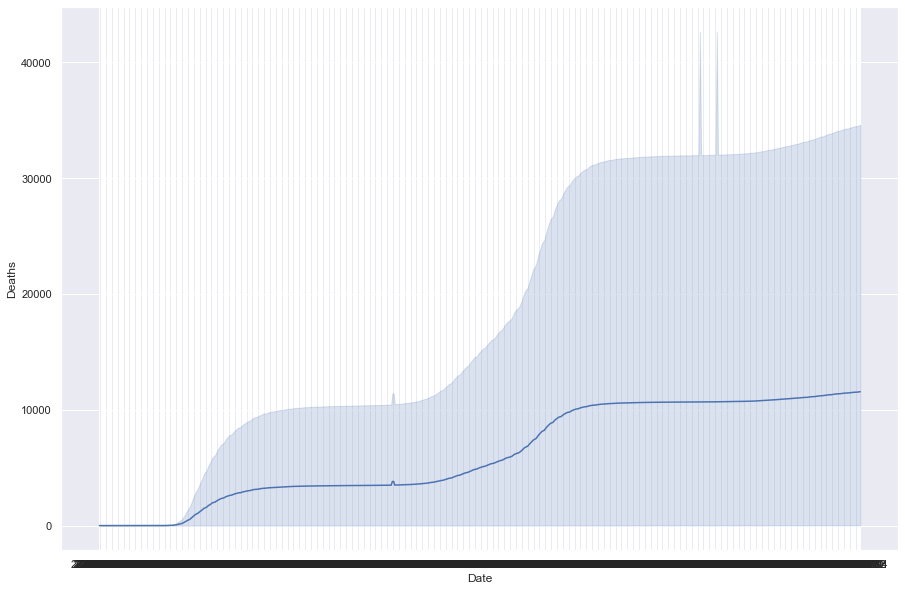

In [15]:
# Create line chart for deaths over time
sns.lineplot(x="Date", y="Deaths", data=covid)

<AxesSubplot:xlabel='Date', ylabel='Cases'>

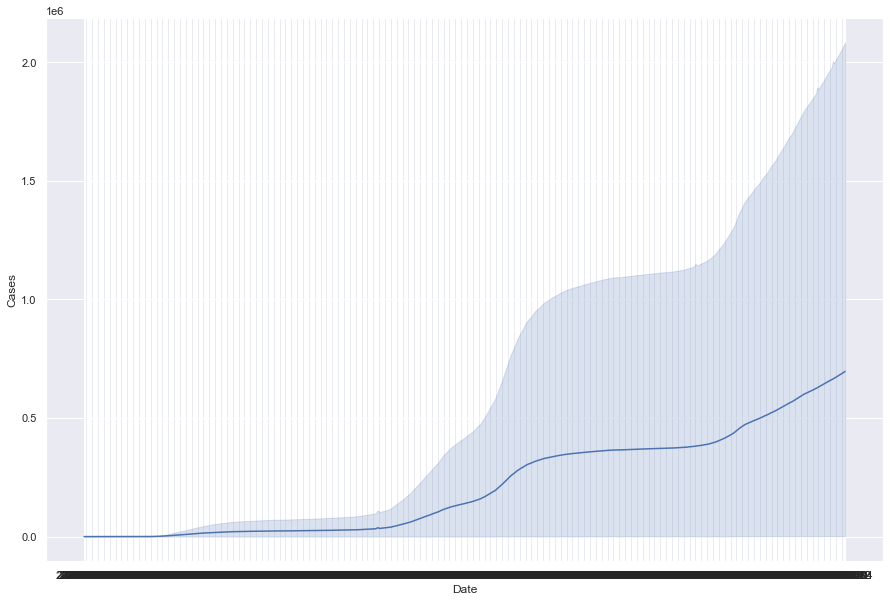

In [16]:
# Create line chart for cases over time
sns.lineplot(x="Date", y="Cases", data=covid)

<AxesSubplot:xlabel='Date', ylabel='Recovered'>

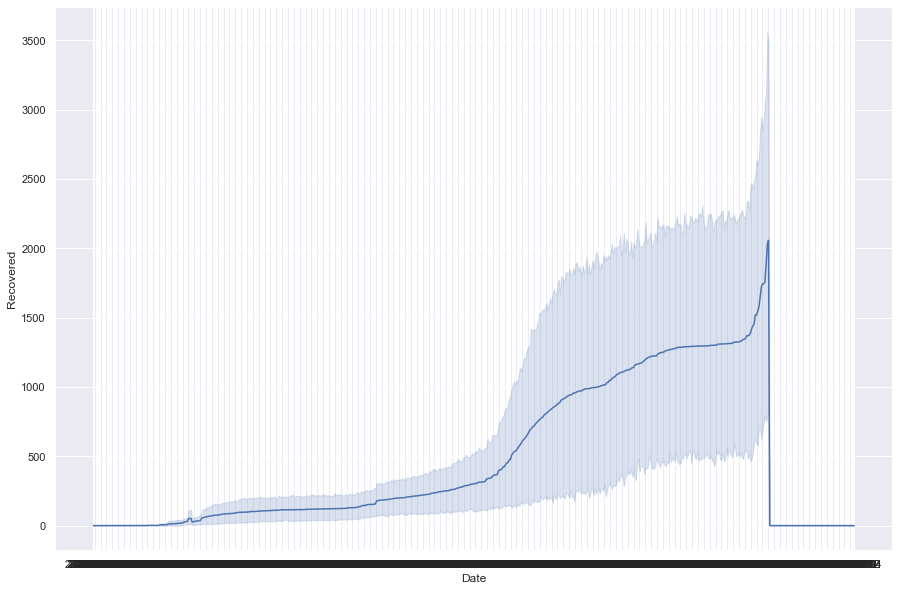

In [17]:
# Create line chart for recovered over time
sns.lineplot(x="Date", y="Recovered", data=covid)

<AxesSubplot:xlabel='Date', ylabel='Hospitalised'>

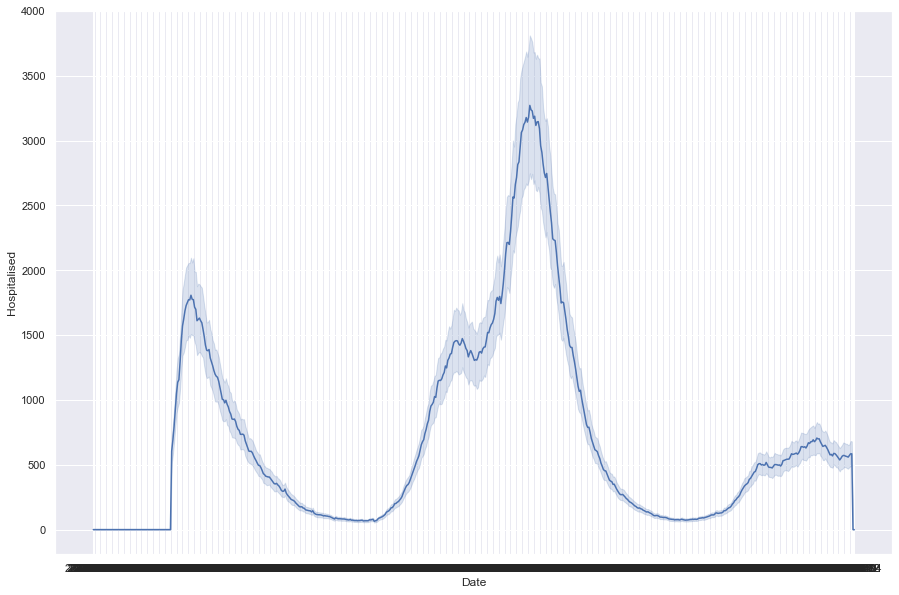

In [18]:
# Create line chart for hospitalised over time
sns.lineplot(x="Date", y="Hospitalised", data=covid)

<AxesSubplot:xlabel='Date', ylabel='Vaccinated'>

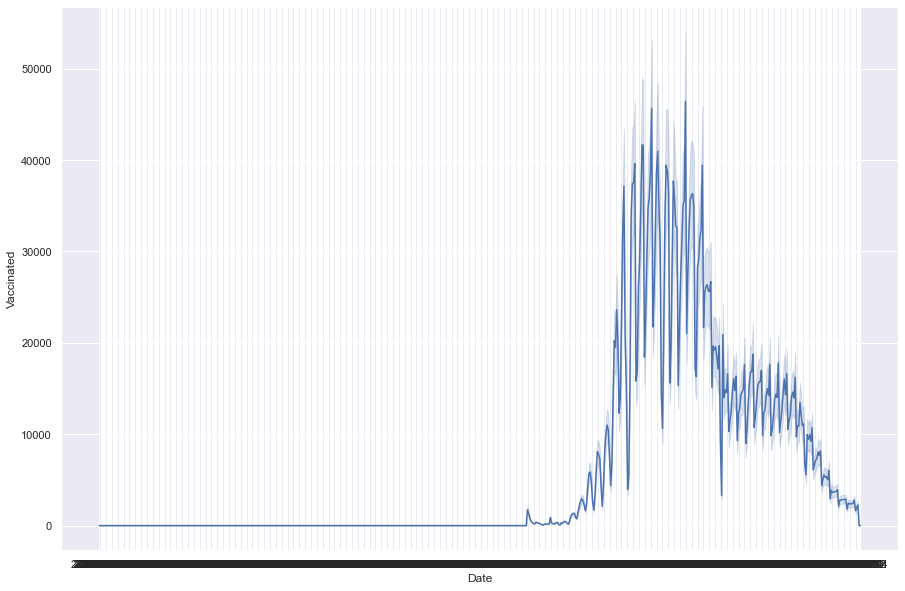

In [19]:
# Create line chart for vaccinated over time
sns.lineplot(x="Date", y="Vaccinated", data=covid)

<AxesSubplot:xlabel='Date', ylabel='First Dose'>

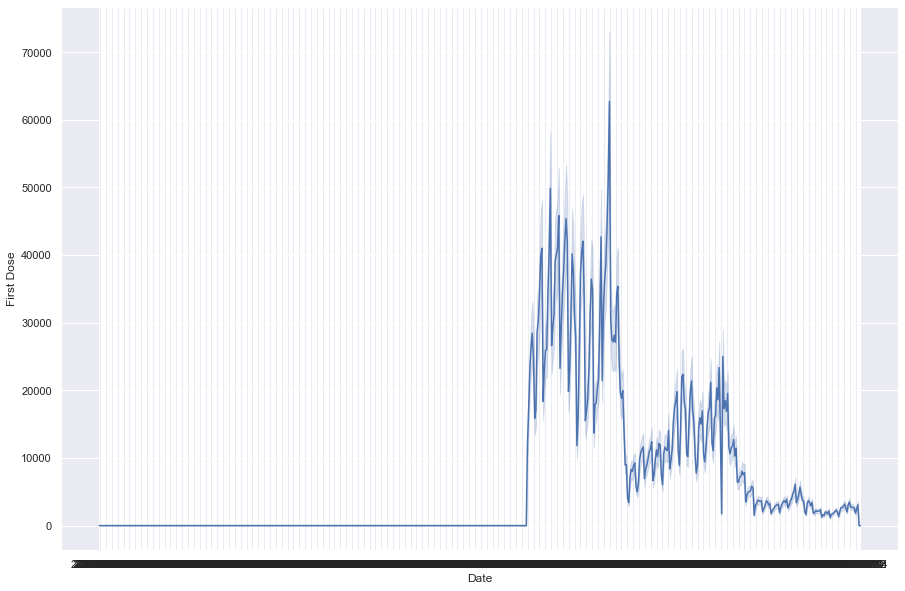

In [20]:
# Create line chart for first dose over time
sns.lineplot(x="Date", y="First Dose", data=covid)

<AxesSubplot:xlabel='Date', ylabel='Second Dose'>

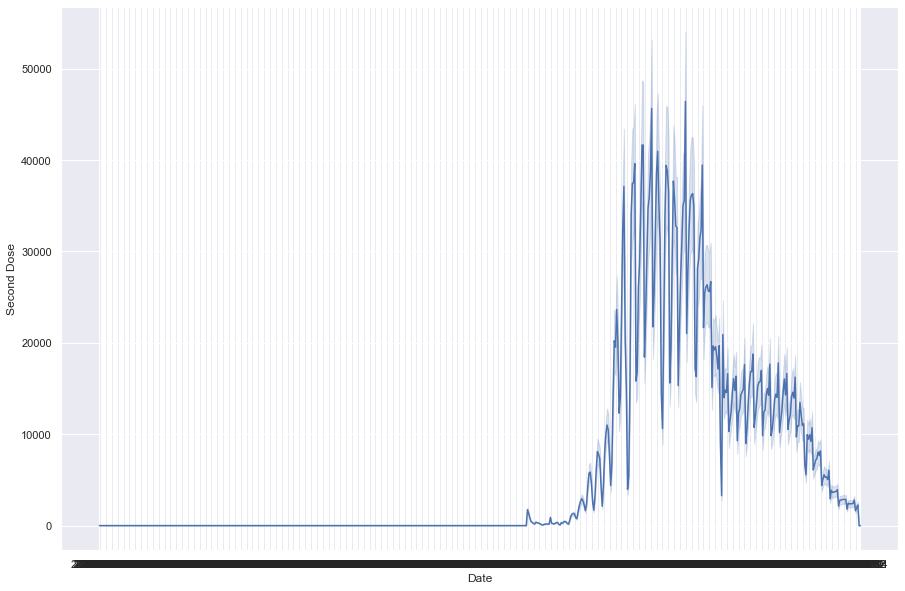

In [21]:
# Create line chart for second dose over time
sns.lineplot(x="Date", y="Second Dose", data=covid)

## Explore behaviour over time - Gibraltar

<AxesSubplot:xlabel='Date', ylabel='Deaths'>

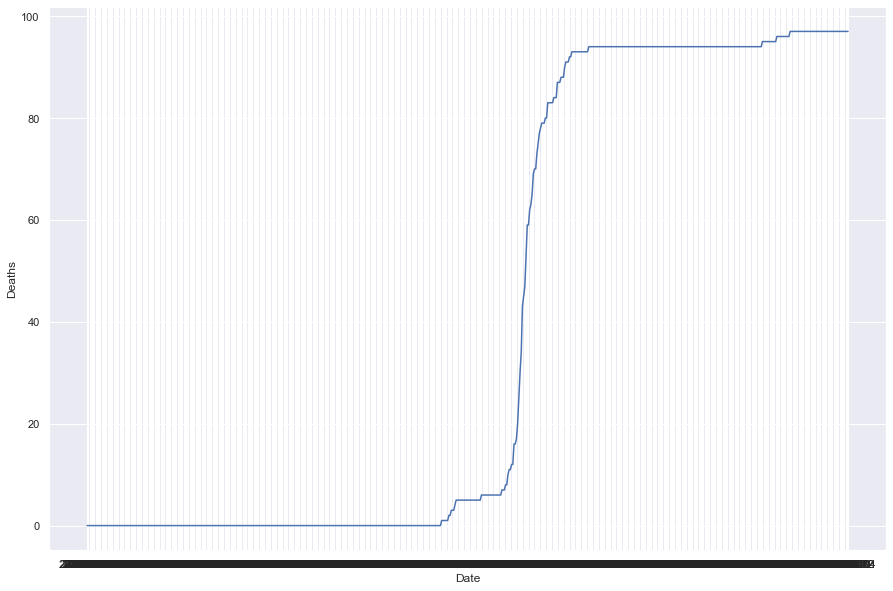

In [22]:
# Create line chart for deaths over time
sns.lineplot(x="Date", y="Deaths", data=gibraltar)

<AxesSubplot:xlabel='Date', ylabel='Cases'>

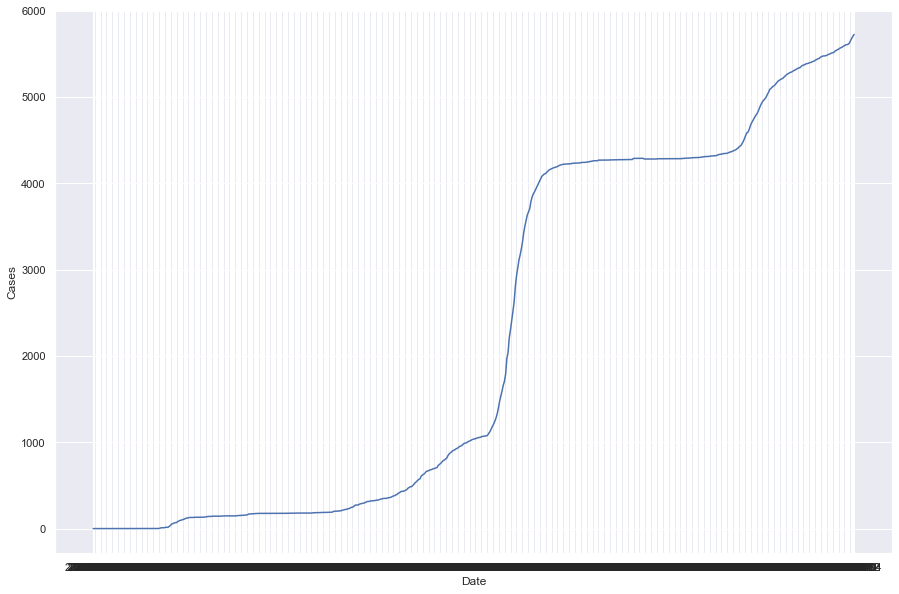

In [23]:
# Create line chart for cases over time
sns.lineplot(x="Date", y="Cases", data=gibraltar)

<AxesSubplot:xlabel='Date', ylabel='Recovered'>

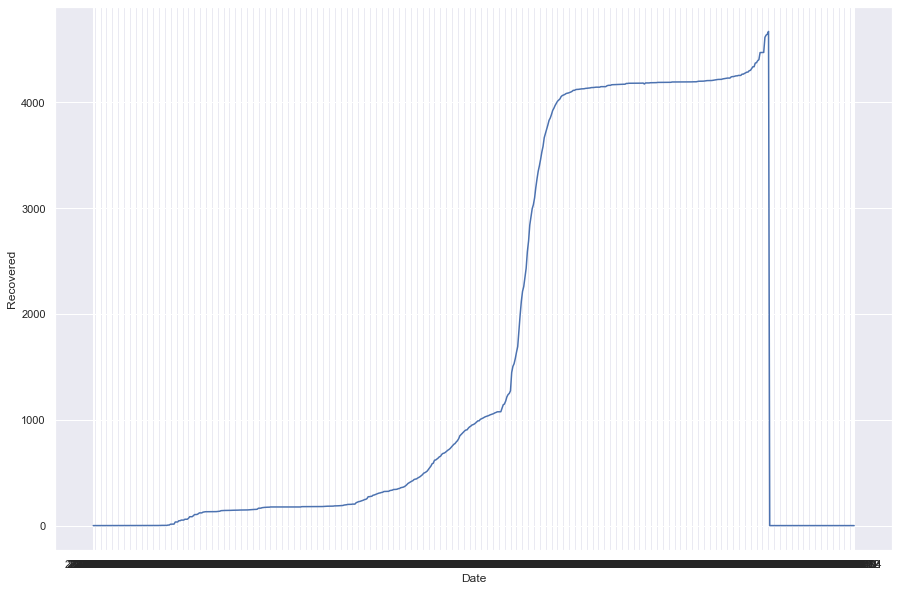

In [24]:
# Create line chart for recovered over time
sns.lineplot(x="Date", y="Recovered", data=gibraltar)

<AxesSubplot:xlabel='Date', ylabel='Hospitalised'>

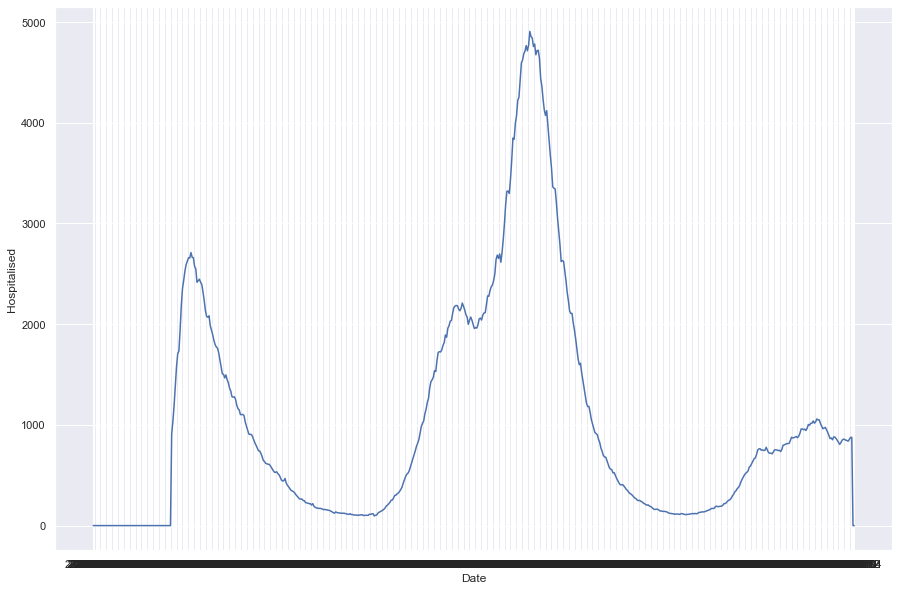

In [25]:
# Create line chart for hospitalised over time
sns.lineplot(x="Date", y="Hospitalised", data=gibraltar)

<AxesSubplot:xlabel='Date', ylabel='Vaccinated'>

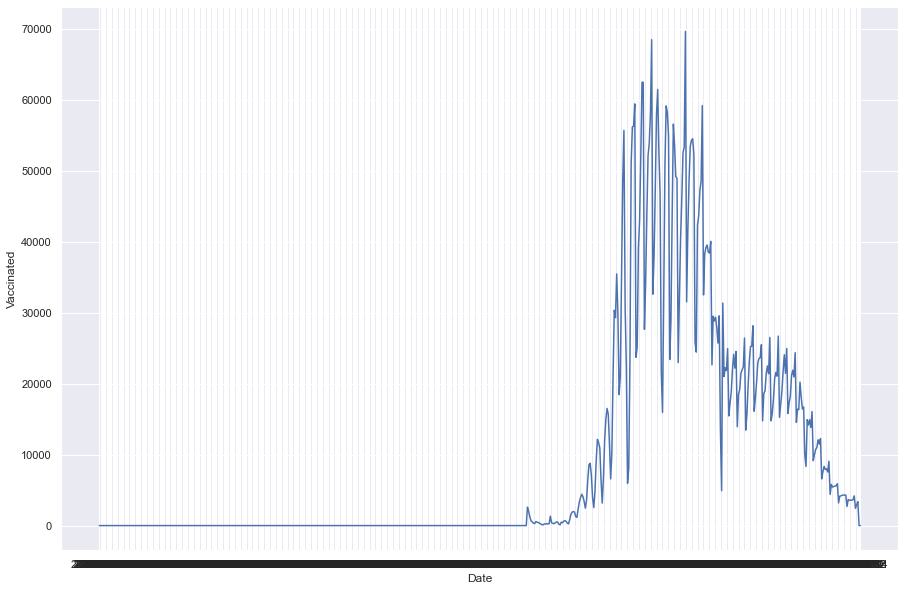

In [26]:
# Create line chart for vaccinated over time
sns.lineplot(x="Date", y="Vaccinated", data=gibraltar)

<AxesSubplot:xlabel='Date', ylabel='First Dose'>

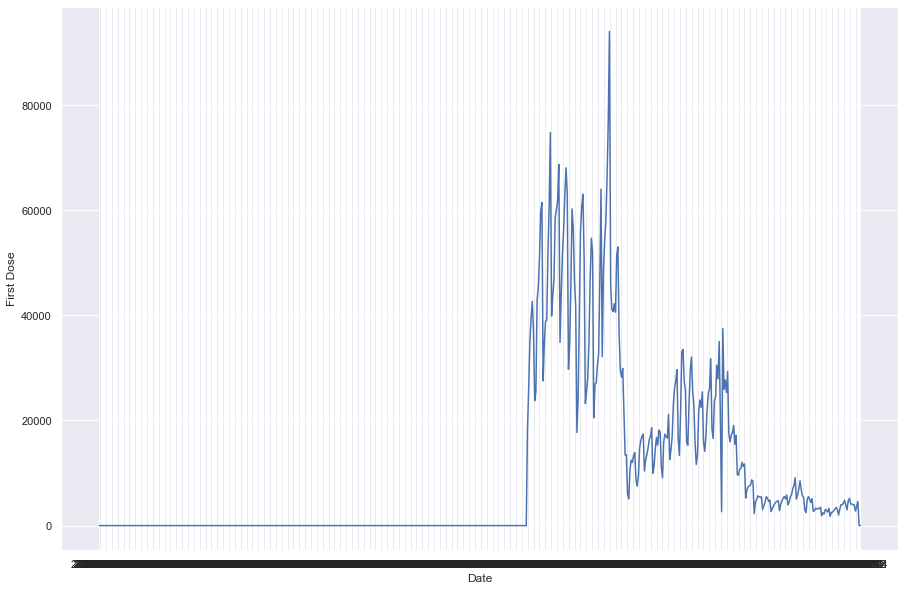

In [27]:
# Create line chart for first dose over time
sns.lineplot(x="Date", y="First Dose", data=gibraltar)

<AxesSubplot:xlabel='Date', ylabel='Second Dose'>

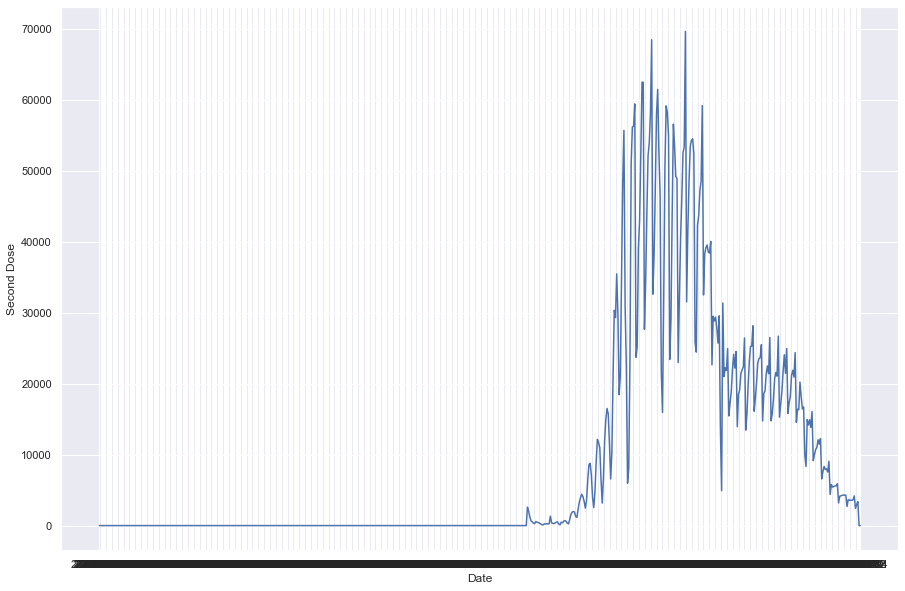

In [28]:
# Create line chart for second dose over time
sns.lineplot(x="Date", y="Second Dose", data=gibraltar)

## Explore behaviour over time - regional comparisons

<AxesSubplot:xlabel='Date', ylabel='Deaths'>

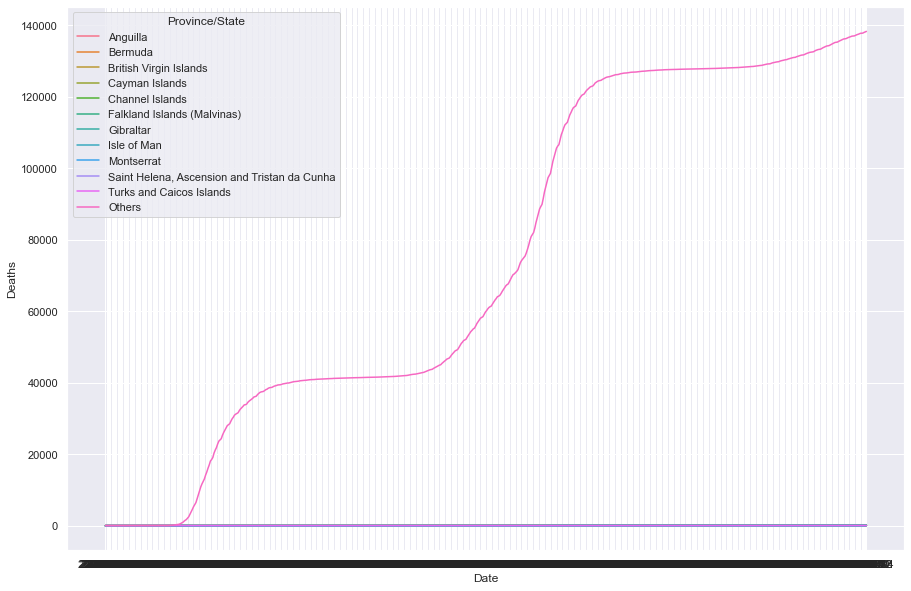

In [29]:
# Compare regional differences over time - Deaths
sns.lineplot(x="Date", y="Deaths", hue="Province/State", data=covid)

<AxesSubplot:xlabel='Province/State', ylabel='Deaths'>

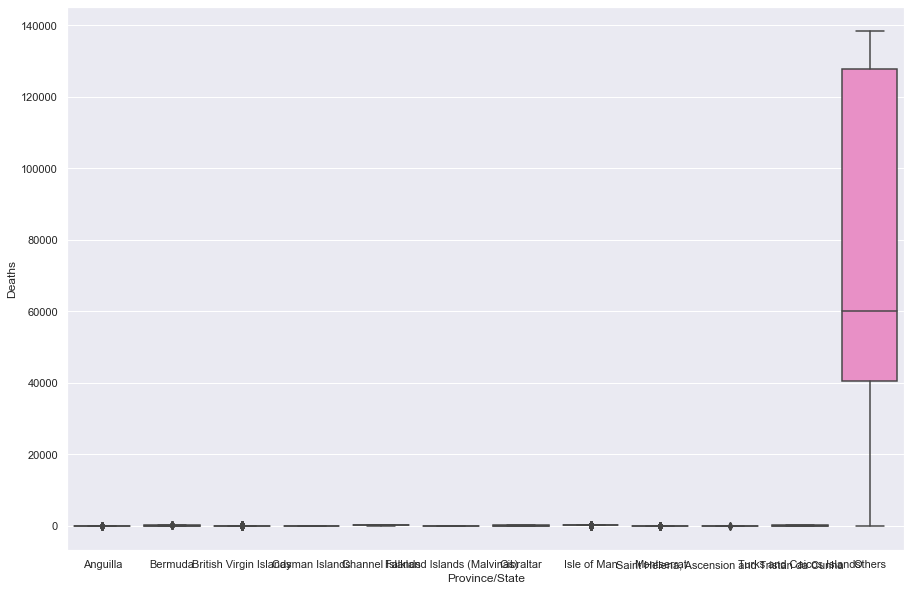

In [30]:
# Generate boxplot to better understand outliers
sns.boxplot(x="Province/State", y= "Deaths", data=covid)

Death observations: There are likely some outliers here from Others that are preventing most of the regions from not displaying. Re-run with Others excluded.

<AxesSubplot:xlabel='Date', ylabel='Deaths'>

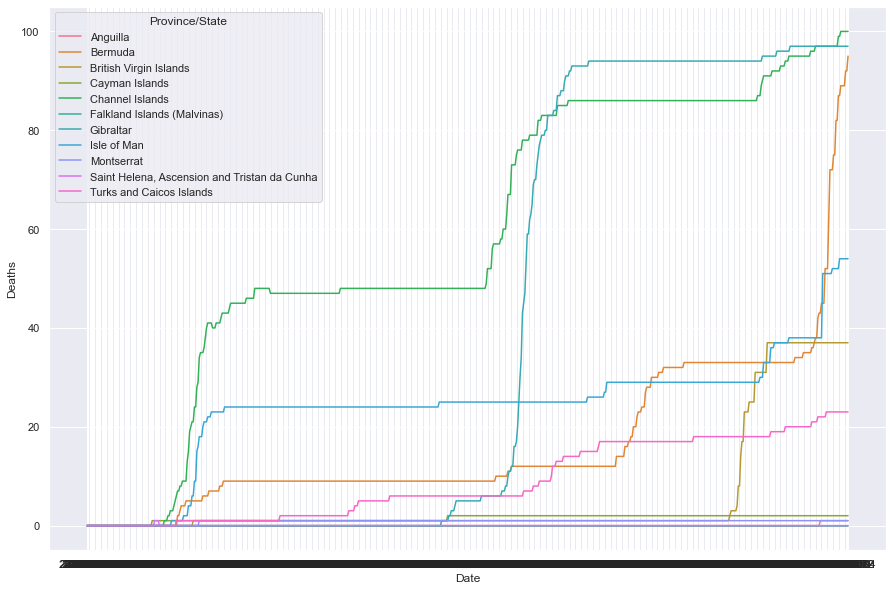

In [31]:
# Compare regional differences over time - Deaths with Others excluded
# Subset to exclude others
covid_no_others = covid[covid['Province/State'] != 'Others']

#Re-run lineplot with new subsetted data
sns.lineplot(x="Date", y="Deaths", hue="Province/State", data=covid_no_others)

<AxesSubplot:xlabel='Date', ylabel='Cases'>

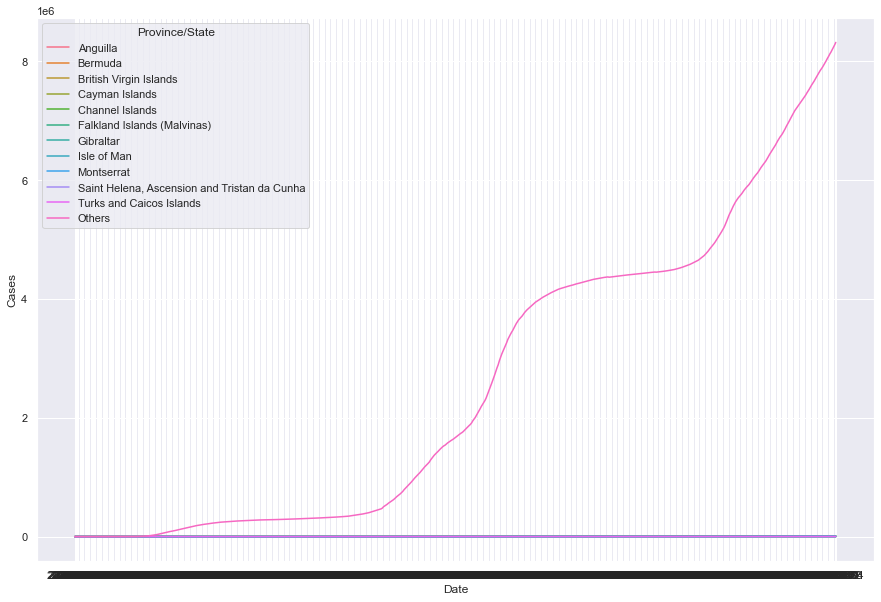

In [32]:
# Compare regional differences over time - Cases
sns.lineplot(x="Date", y="Cases", hue="Province/State", data=covid)

<AxesSubplot:xlabel='Province/State', ylabel='Cases'>

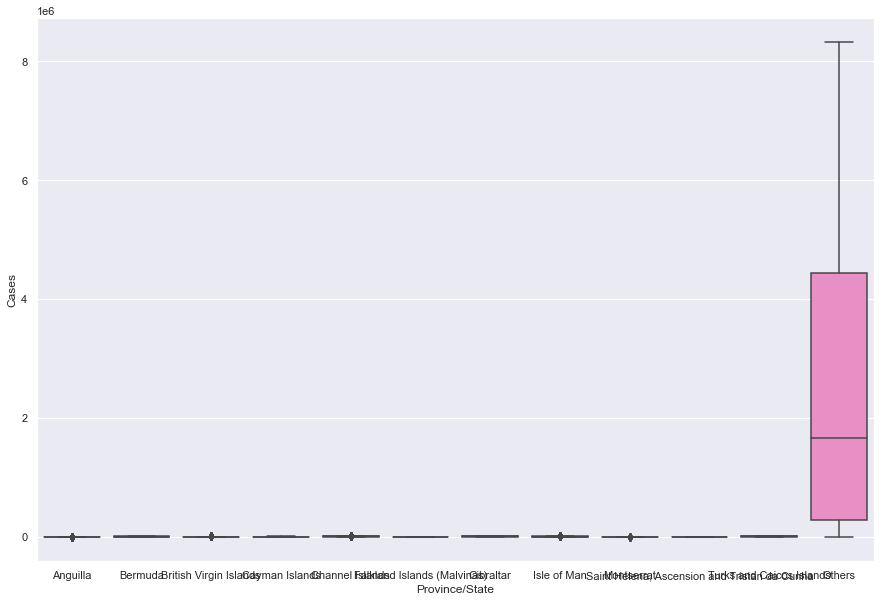

In [34]:
# Generate boxplot to better understand outliers
sns.boxplot(x="Province/State", y= "Cases", data=covid)

Case observations: Similar to deaths, there are likely some outliers here from Others that are preventing most of the regions from not displaying. Re-run with Others excluded.

<AxesSubplot:xlabel='Date', ylabel='Cases'>

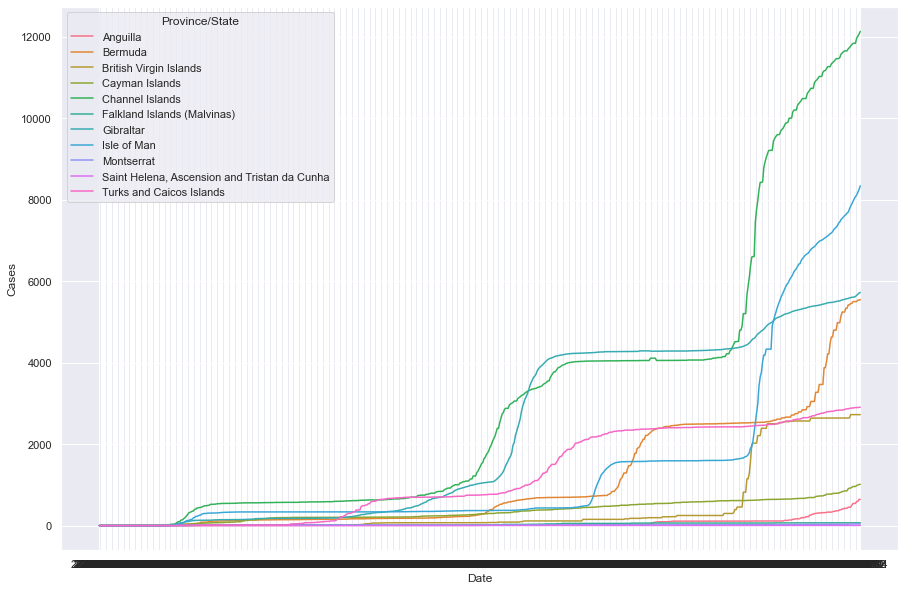

In [35]:
#Re-run lineplot with Others removed
sns.lineplot(x="Date", y="Cases", hue="Province/State", data=covid_no_others)

<AxesSubplot:xlabel='Date', ylabel='Recovered'>

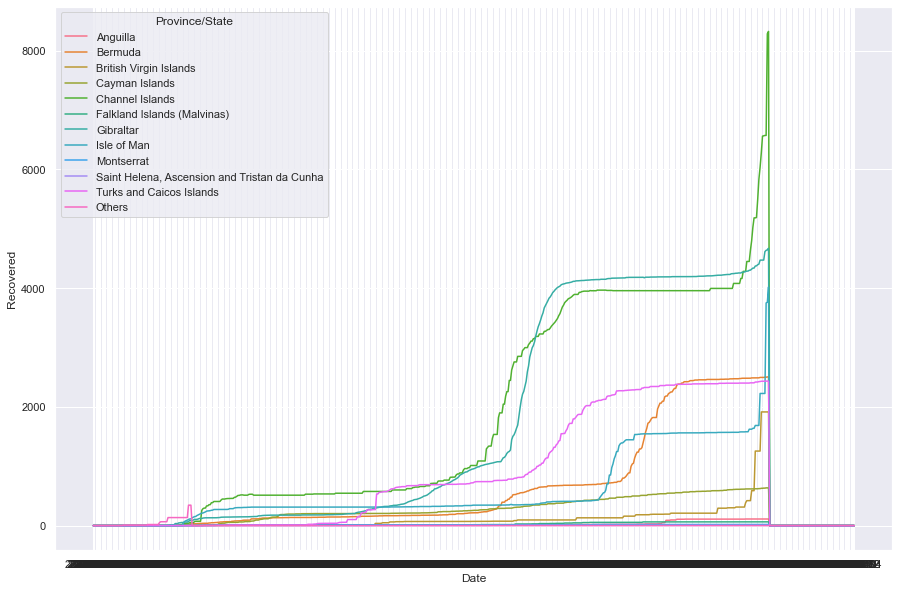

In [36]:
# Compare regional differences over time - Recovered
sns.lineplot(x="Date", y="Recovered", hue="Province/State", data=covid)

<AxesSubplot:xlabel='Date', ylabel='Hospitalised'>

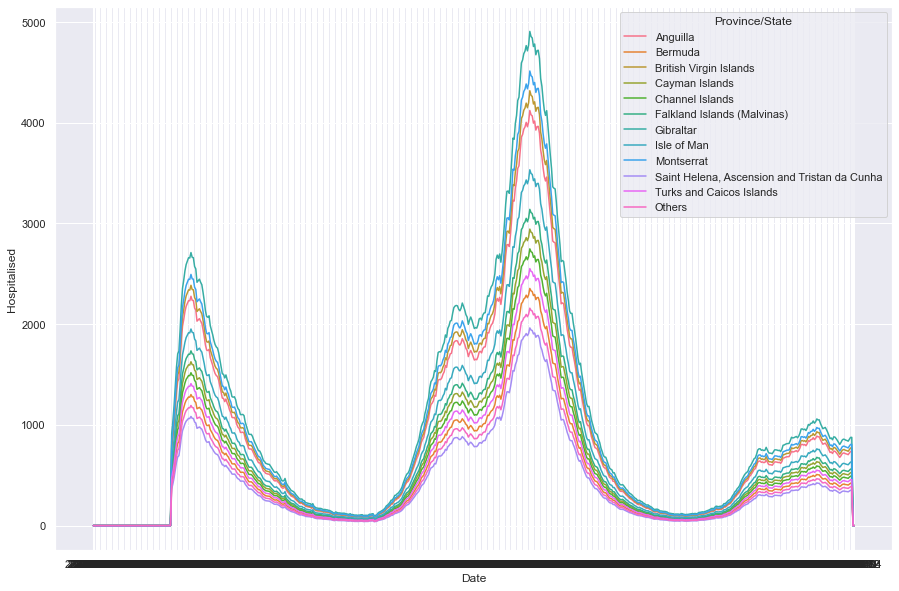

In [37]:
# Compare regional differences over time - Hospitalised
sns.lineplot(x="Date", y="Hospitalised", hue="Province/State", data=covid)

<AxesSubplot:xlabel='Date', ylabel='Vaccinated'>

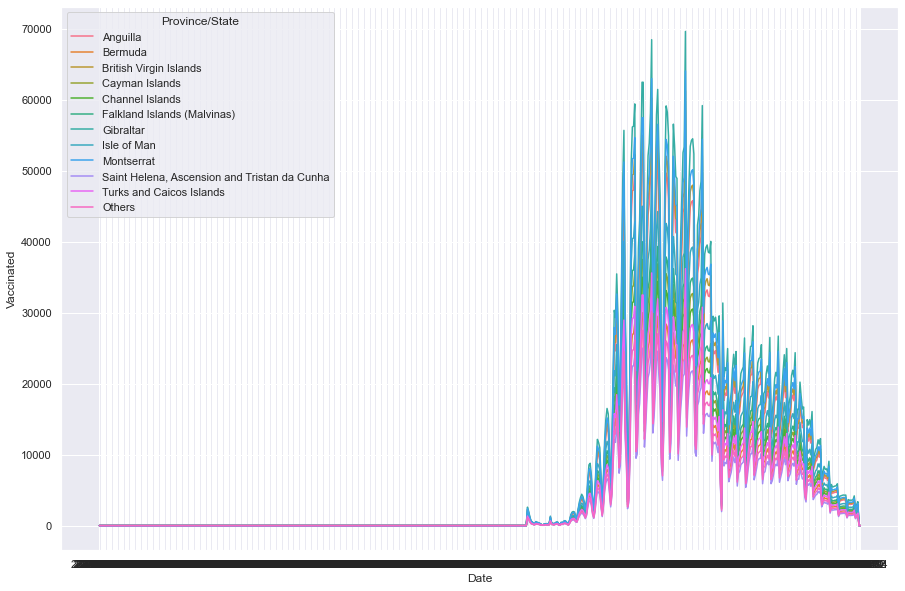

In [38]:
# Compare regional differences over time - Vaccinated
sns.lineplot(x="Date", y="Vaccinated", hue="Province/State", data=covid)

<AxesSubplot:xlabel='Date', ylabel='First Dose'>

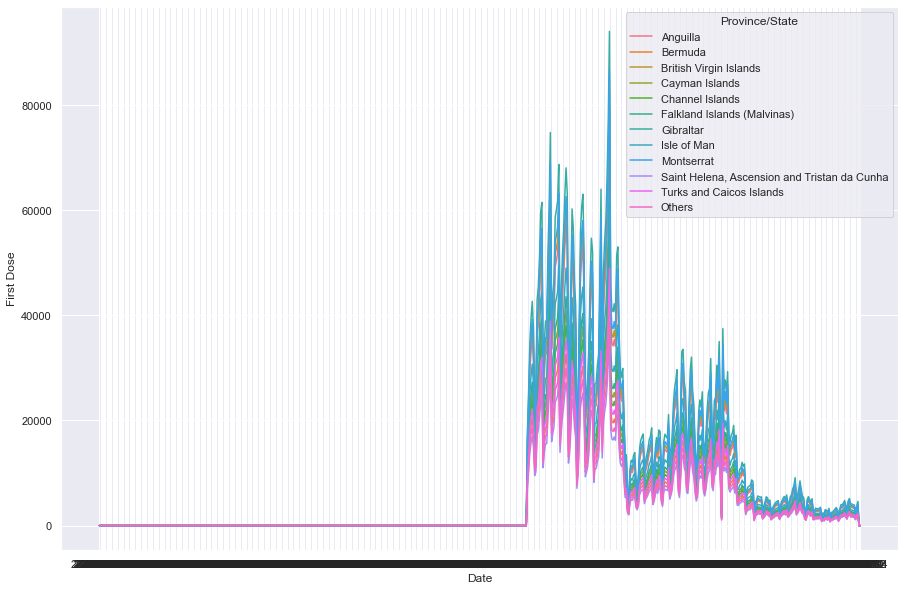

In [39]:
# Compare regional differences over time - First Dose
sns.lineplot(x="Date", y="First Dose", hue="Province/State", data=covid)

<AxesSubplot:xlabel='Date', ylabel='Second Dose'>

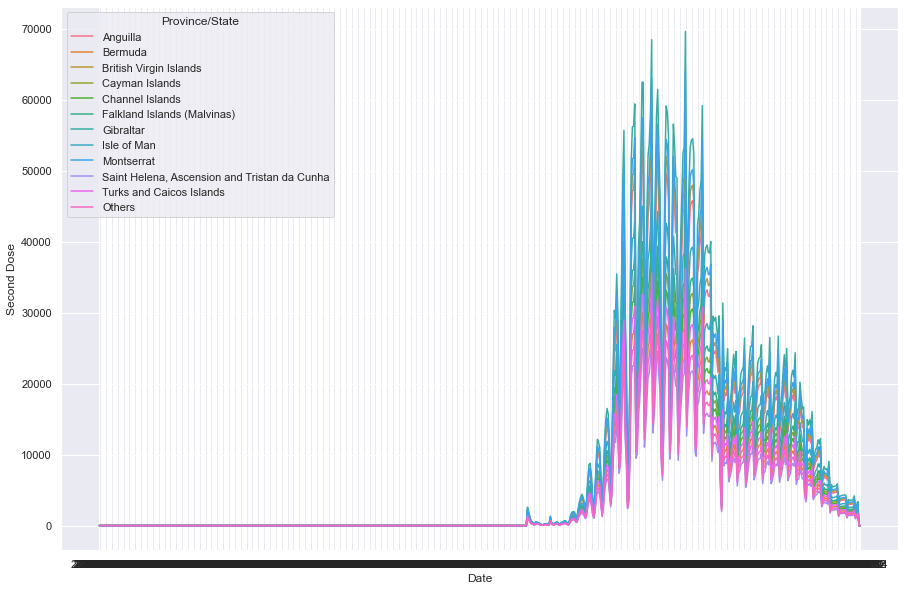

In [40]:
# Compare regional differences over time - Second Dose
sns.lineplot(x="Date", y="Second Dose", hue="Province/State", data=covid)

# Assignment 2 key observations:

- There are missing values in the covid_19_uk_cases data set in the columns: Deaths, Cases, Recovered, and Hospitalised
- There are no missing values in the covid_19_uk_vaccinated data set
- Both data sets contain common columns: Province/State, Country/Region, Lat, Long, ISO codes, Sub-region Name, and Intermediate Region Code. 
- The cases data set contains information on Deaths, Cases, Recovered, and Hospitalised while the vaccinated data set contains information on Vaccinated, First Dose, and Second Dose.

- Overall behaviour over time:
    - Deaths: Deaths have peaked and seem to be stable now
    - Cases: Cases rose, stabilised, and seem to be rising again 
    - Recovered: Recoveries reached a peak and then a steep decline
    - Hospitalised: There are three peaks of note. The largest peak seems to have been reached already.
    - Vaccinations:There are sharp daily fluctuations but an overall high peak with lower numbers of vaccinations now
    - First Dose/Second Dose: There is a peak in first doses followed by a sharp decline. During the deline in first doses, there is a peak in second doses.
- Gibralatar behaviour over time: Gibralatar roughly follows similar patterns as the overall UK data but with sharper peaks in deaths and cases.
- Regional comparisons: The general shape of the data is similar across regions in terms of deaths, cases, and recovered but seems to occur at different points in time. Meanwhile, the data for hospitalised, vaccinated, first dose, and second dose is similar across all regions. Some peaks also rise more sharply in some regions, but this could be due to differences in population size.

#### Use the process of exploring the data for Gibraltar as example to provide a brief description of the various phases to help your team to understand the process. Keep it high level and make sure to focus on both specifics relating to the case (first dose, second dose per region, total and over time) and brief observations regarding the process. Assignment two considers basic data exploration.
- Can we make decisions based on total numbers only, or do trends over time offer additional insights?
- Why it is important to explore the data, what are the typical mistakes made in this phase?

It is very important to explore the data. In any given scenario, we may encounter missing and messy data. In addition, sometimes we can't identify missing values or data quality issues until after we have imported the data. Overlooking these data quality issues can result in incorrect results with significant negative consequences.

It is also important to look at trends over time rather than relying on total numbers alone. Looking at trends allows us to gain additional insights on how the data has behaved over time and can even help us make predictions on what might happen next.

# 3) Assignment activity 3: [Merge and analyse the data](https://fourthrev.instructure.com/courses/313/pages/assignment-activity-3-merge-and-analyse-the-data?module_item_id=20649)

#### 3.1) Report expectations:
- Merge and explore the data
- Convert the data type of the Date column from object to datetime
- Create a dataset that meets the expected parameters
- Add calculated features to dataframes (difference between first and second dose vaccinations)
- Filter and sort output
- Observe totals and percentages as a total and over time
- Note observations

## Join the DataFrames and explore

In [41]:
# Join the DataFrames as covid where you merge cov and vac
covid = pd.merge(cov, vac)
print(covid.shape)
print(covid.columns)

(7584, 15)
Index(['Province/State', 'Country/Region', 'Lat', 'Long',
       'ISO 3166-1 Alpha 3-Codes', 'Sub-region Name',
       'Intermediate Region Code', 'Date', 'Deaths', 'Cases', 'Recovered',
       'Hospitalised', 'Vaccinated', 'First Dose', 'Second Dose'],
      dtype='object')


In [42]:
# Explore the new DataFrame
print(covid.info())
print(covid.describe())
print(covid.head())
print(covid.tail())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7584 entries, 0 to 7583
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Province/State            7584 non-null   object 
 1   Country/Region            7584 non-null   object 
 2   Lat                       7584 non-null   float64
 3   Long                      7584 non-null   float64
 4   ISO 3166-1 Alpha 3-Codes  7584 non-null   object 
 5   Sub-region Name           7584 non-null   object 
 6   Intermediate Region Code  7584 non-null   int64  
 7   Date                      7584 non-null   object 
 8   Deaths                    7582 non-null   float64
 9   Cases                     7582 non-null   float64
 10  Recovered                 7582 non-null   float64
 11  Hospitalised              7582 non-null   float64
 12  Vaccinated                7584 non-null   int64  
 13  First Dose                7584 non-null   int64  
 14  Second D

## Adjust date and add in month

In [43]:
# Fix the date column data type
# Import the DateTime module
import datetime

# Change the Date column to date type
covid['Date'] = pd.to_datetime(covid['Date'])

# Check that data type has been changed
print(covid.dtypes)

Province/State                      object
Country/Region                      object
Lat                                float64
Long                               float64
ISO 3166-1 Alpha 3-Codes            object
Sub-region Name                     object
Intermediate Region Code             int64
Date                        datetime64[ns]
Deaths                             float64
Cases                              float64
Recovered                          float64
Hospitalised                       float64
Vaccinated                           int64
First Dose                           int64
Second Dose                          int64
dtype: object


In [44]:
# Create Month column
covid['Month'] = pd.to_datetime(covid['Date'] + pd.offsets.MonthBegin(0))

# Check that new column has been created
print(covid.dtypes)
print(covid.head())
print(covid.tail())

Province/State                      object
Country/Region                      object
Lat                                float64
Long                               float64
ISO 3166-1 Alpha 3-Codes            object
Sub-region Name                     object
Intermediate Region Code             int64
Date                        datetime64[ns]
Deaths                             float64
Cases                              float64
Recovered                          float64
Hospitalised                       float64
Vaccinated                           int64
First Dose                           int64
Second Dose                          int64
Month                       datetime64[ns]
dtype: object
  Province/State  Country/Region      Lat     Long ISO 3166-1 Alpha 3-Codes  \
0       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   
1       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   
2       Anguilla  United Kingdom  18.2206 -63.0686           

## Clean DataFrame

In [45]:
# Clean up / drop unnecessary columns 
covid_clean = covid.drop(columns=["Lat", "Long", "ISO 3166-1 Alpha 3-Codes", "Sub-region Name", "Intermediate Region Code"])

# Check cleaned DataFrame
print(covid_clean.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7584 entries, 0 to 7583
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Province/State  7584 non-null   object        
 1   Country/Region  7584 non-null   object        
 2   Date            7584 non-null   datetime64[ns]
 3   Deaths          7582 non-null   float64       
 4   Cases           7582 non-null   float64       
 5   Recovered       7582 non-null   float64       
 6   Hospitalised    7582 non-null   float64       
 7   Vaccinated      7584 non-null   int64         
 8   First Dose      7584 non-null   int64         
 9   Second Dose     7584 non-null   int64         
 10  Month           7584 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(4), int64(3), object(2)
memory usage: 711.0+ KB
None


## Groupby and calculate difference between first and second dose

In [49]:
# Calculate difference between first and second dose
covid_clean['Vaccination Difference'] = covid_clean['First Dose'] - covid_clean['Second Dose']
covid_clean

,Province/State,Country/Region,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose,Month,Vaccination Difference,First Dose %,Second Dose %
0,Anguilla,United Kingdom,2020-01-22,0.0,0.0,0.0,0.0,0,0,0,2020-02-01,0,NaN,NaN
1,Anguilla,United Kingdom,2020-01-23,0.0,0.0,0.0,0.0,0,0,0,2020-02-01,0,NaN,NaN
2,Anguilla,United Kingdom,2020-01-24,0.0,0.0,0.0,0.0,0,0,0,2020-02-01,0,NaN,NaN
3,Anguilla,United Kingdom,2020-01-25,0.0,0.0,0.0,0.0,0,0,0,2020-02-01,0,NaN,NaN
4,Anguilla,United Kingdom,2020-01-26,0.0,0.0,0.0,0.0,0,0,0,2020-02-01,0,NaN,NaN
5,Anguilla,United Kingdom,2020-01-27,0.0,0.0,0.0,0.0,0,0,0,2020-02-01,0,NaN,NaN
6,Anguilla,United Kingdom,2020-01-28,0.0,0.0,0.0,0.0,0,0,0,2020-02-01,0,NaN,NaN
7,Anguilla,United Kingdom,2020-01-29,0.0,0.0,0.0,0.0,0,0,0,2020-02-01,0,NaN,NaN
8,Anguilla,United Kingdom,2020-01-30,0.0,0.0,0.0,0.0,0,0,0,2020-02-01,0,NaN,NaN
9,Anguilla,United Kingdom,2020-01-31,0.0,0.0,0.0,0.0,0,0,0,2020-02-01,0,NaN,NaN


In [47]:
# Calculate % who have received first dose
covid_clean['First Dose %'] = covid_clean['Vaccination Difference'] * 100 / (covid_clean['First Dose'])
print(covid_clean.describe())

              Deaths         Cases    Recovered  Hospitalised    Vaccinated  \
count    7582.000000  7.582000e+03  7582.000000   7582.000000   7584.000000   
mean     6210.202321  2.147082e+05   454.691242    685.228568   5913.547600   
std     24860.790148  1.007557e+06  1010.642337    819.256635  10846.410258   
min         0.000000  0.000000e+00     0.000000      0.000000      0.000000   
25%         0.000000  1.200000e+01     0.000000    105.000000      0.000000   
50%         1.000000  1.685000e+02    13.000000    390.000000      0.000000   
75%        25.000000  1.585000e+03   312.000000    955.750000   8338.000000   
max    138237.000000  8.317439e+06  8322.000000   4907.000000  69619.000000   

         First Dose   Second Dose  Vaccination Difference  First Dose %  
count   7584.000000   7584.000000             7584.000000   3300.000000  
mean    6192.822257   5913.547600              279.274657    -91.944700  
std    11439.883647  10846.410258            12888.099629    154.6

In [48]:
# Calculate % who have received second dose
covid_clean['Second Dose %'] = (covid_clean['Second Dose'] * 100) / (covid_clean['First Dose'])
print(covid_clean.describe())

              Deaths         Cases    Recovered  Hospitalised    Vaccinated  \
count    7582.000000  7.582000e+03  7582.000000   7582.000000   7584.000000   
mean     6210.202321  2.147082e+05   454.691242    685.228568   5913.547600   
std     24860.790148  1.007557e+06  1010.642337    819.256635  10846.410258   
min         0.000000  0.000000e+00     0.000000      0.000000      0.000000   
25%         0.000000  1.200000e+01     0.000000    105.000000      0.000000   
50%         1.000000  1.685000e+02    13.000000    390.000000      0.000000   
75%        25.000000  1.585000e+03   312.000000    955.750000   8338.000000   
max    138237.000000  8.317439e+06  8322.000000   4907.000000  69619.000000   

         First Dose   Second Dose  Vaccination Difference  First Dose %  \
count   7584.000000   7584.000000             7584.000000   3300.000000   
mean    6192.822257   5913.547600              279.274657    -91.944700   
std    11439.883647  10846.410258            12888.099629    15

In [50]:
# Use groupby() to determine vaccination difference between regions and sort values
covid_clean.groupby("Province/State")[["Vaccination Difference"]].sum().sort_values("Vaccination Difference")

,Vaccination Difference
Province/State,
"Saint Helena, Ascension and Tristan da Cunha",105889
Others,116482
Bermuda,127073
Turks and Caicos Islands,137686
Channel Islands,148261
Cayman Islands,158852
Falkland Islands (Malvinas),169438
Isle of Man,190639
Anguilla,222398


## Groupby and calculate difference between first and second dose over time

In [51]:
# Use groupby() to observe difference between first and second dose over monthly periods
covid_clean.groupby("Month")[["Vaccination Difference"]].sum().sort_values("Month")

,Vaccination Difference
Month,
2020-02-01,0
2020-03-01,0
2020-04-01,0
2020-05-01,0
2020-06-01,0
2020-07-01,0
2020-08-01,0
2020-09-01,0
2020-10-01,0


#### We use similar calculations and representations as we had in activity 2, but now expand to look at all provinces. Assignment 3 is concerned with exploring data in the context of a specific business question (as opposed to general exploration in assignment 2).
- What insights can be gained from the data? (Description of all regions, assumptions and concerns, trends or patterns you have observed.)
- Are there limitations or assumptions that needs to be considered?
- Make sure to provide a brief overview of the data and typical considerations at this phase of analysis

 - May seems to be the month in which the number of fully vaccinated people became larger than the number who had only received the first dose
 - Considerations need to be taken into account over absolute numbers since some regions will have larger populations than others
 - There may be some differences in visualisations produced using the entire date versus months

# 4) Assignment activity 4: [Visualise and identify initial trends](https://fourthrev.instructure.com/courses/313/pages/assignment-activity-4-visualise-and-identify-initial-trends?module_item_id=21381)

The government is looking to promote second dose vaccinations and looking for the first area to test a new campaign. They are looking for the highest number of people who have received a first dose and not a second dose. 
- Where should they target?
- Which provinces have the highest number (actual numbers) and highest relative numbers (second dose only/first dose)
- Visualise both outputs.

#### 4.1) Report expectations:
- Consider additional features (deaths and recoveries)
- Visualise the data
- Note observations
 - Do deaths follow the same patterns observed in vaccination data (daily vs cumulative)?
 - Do we need to separate groups of data for specific variables and analyse them in isolation (Others) to be able to observe the patterns?

#### 4.2) Presentation expectations:
- What insights can be gained from the data?
- Why do we need to consider other features?
- **Note**: Different features evaluated to improve decision making (deaths and recoveries); why it is important to explore data and use different views; Highlight two or three suggestions to get junior team members started in terms of good practices

## Analyse the number of people who have received a first dose but not a second dose

Text(0.5, 1.0, 'First dose over time - all regions')

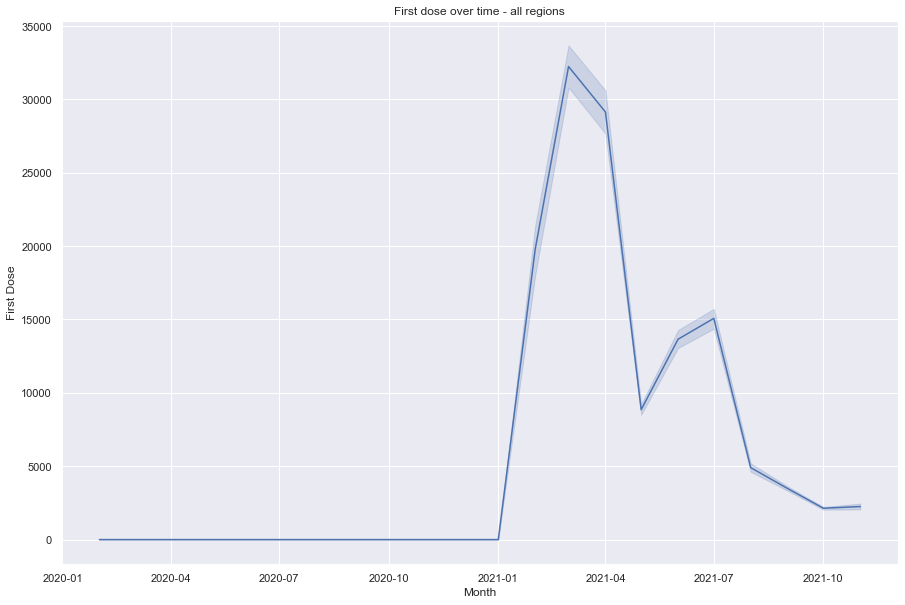

In [52]:
# First dose - all regions
first = sns.lineplot(x="Month", y = "First Dose", data=covid_clean)
first.set_title("First dose over time - all regions")

Text(0.5, 1.0, 'Second dose over time - all regions')

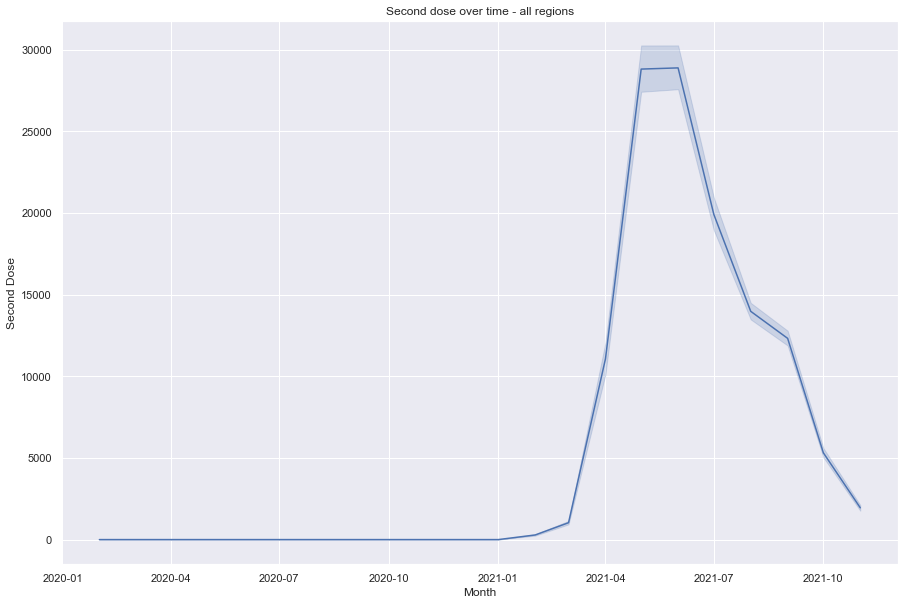

In [53]:
# Second dose - all regions
first = sns.lineplot(x="Month", y = "Second Dose", data=covid_clean)
first.set_title("Second dose over time - all regions")

In [54]:
# Use groupby() to determine vaccination difference between regions and sort values (absolute numbers)
covid_clean.groupby("Province/State")[["Vaccination Difference"]].sum().sort_values("Vaccination Difference")

,Vaccination Difference
Province/State,
"Saint Helena, Ascension and Tristan da Cunha",105889
Others,116482
Bermuda,127073
Turks and Caicos Islands,137686
Channel Islands,148261
Cayman Islands,158852
Falkland Islands (Malvinas),169438
Isle of Man,190639
Anguilla,222398


Text(0.5, 1.0, 'Difference between second dose and first dose by region')

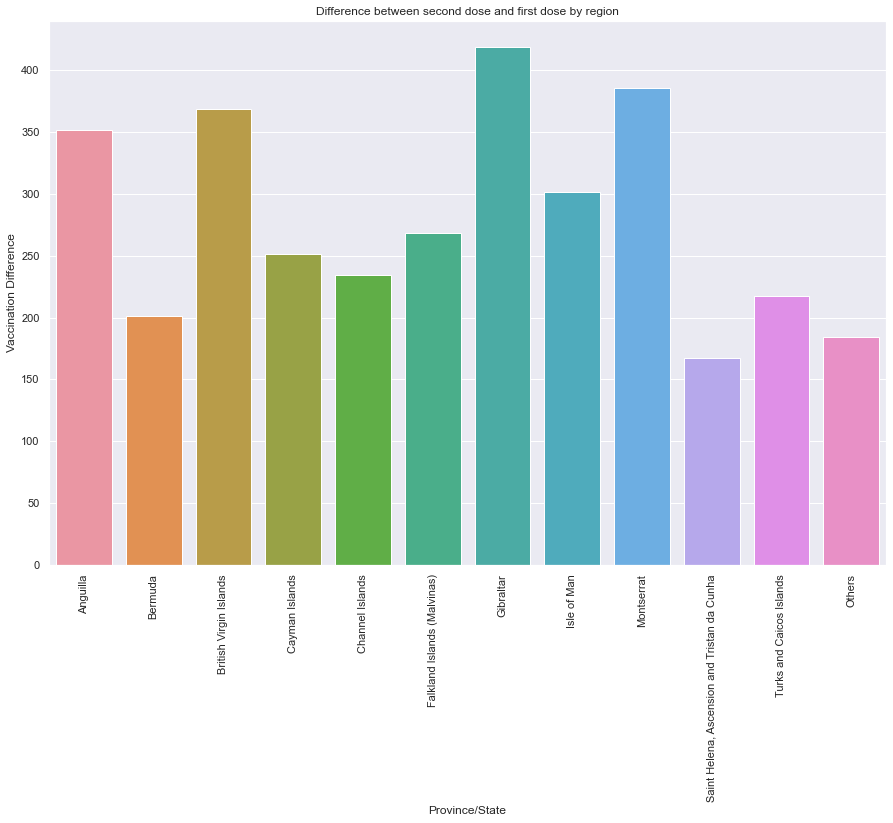

In [55]:
# Create visualistion of difference (absolute numbers)
sns.barplot(x="Province/State", y="Vaccination Difference", data=covid_clean, ci=None)
plt.xticks(rotation=90)
plt.title("Difference between second dose and first dose by region")

## Relative numbers

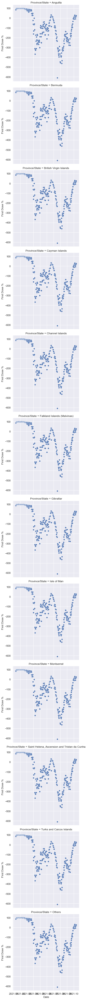

In [58]:
# Examine data across regions over time
sns.relplot(x="Date", y="First Dose %", row="Province/State", data=covid_clean)

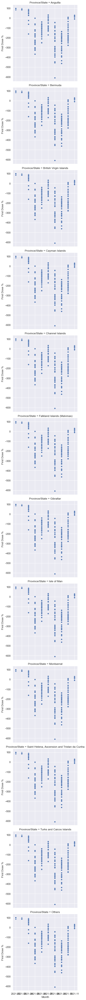

In [59]:
# Examine data across regions over time
sns.relplot(x="Month", y="First Dose %", row="Province/State", data=covid_clean)

Text(0.5, 1.0, 'First Dose % over time - all regions')

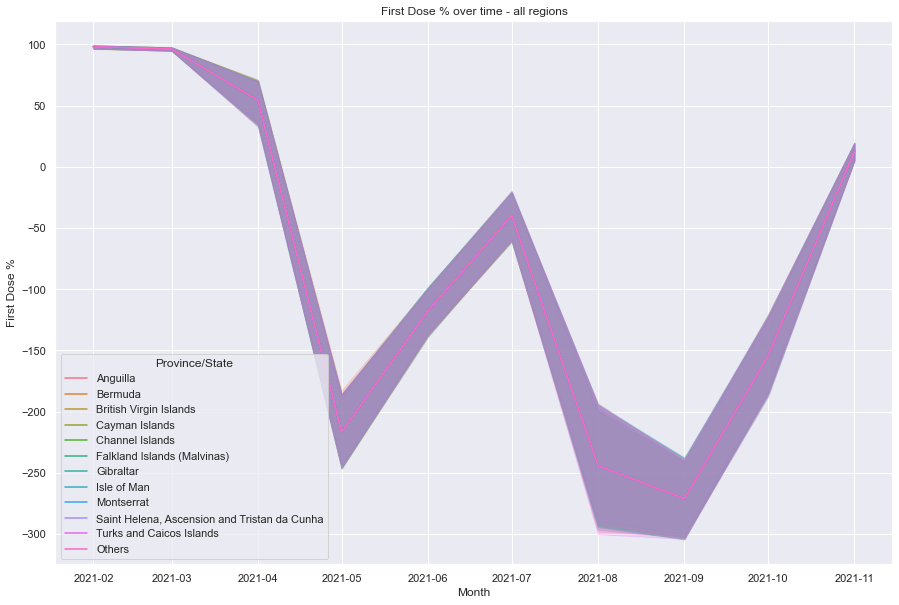

In [60]:
# Create lineplot to compare regions first dose % across time
first_percentage = sns.lineplot(x="Month", y="First Dose %", hue= "Province/State", data = covid_clean)
first_percentage.set_title("First Dose % over time - all regions")

## Other features evaluated (data preparation, output and plots)

### Total vaccinations  - overall and for a particular region

Text(0.5, 1.0, 'Total vaccinations over time')

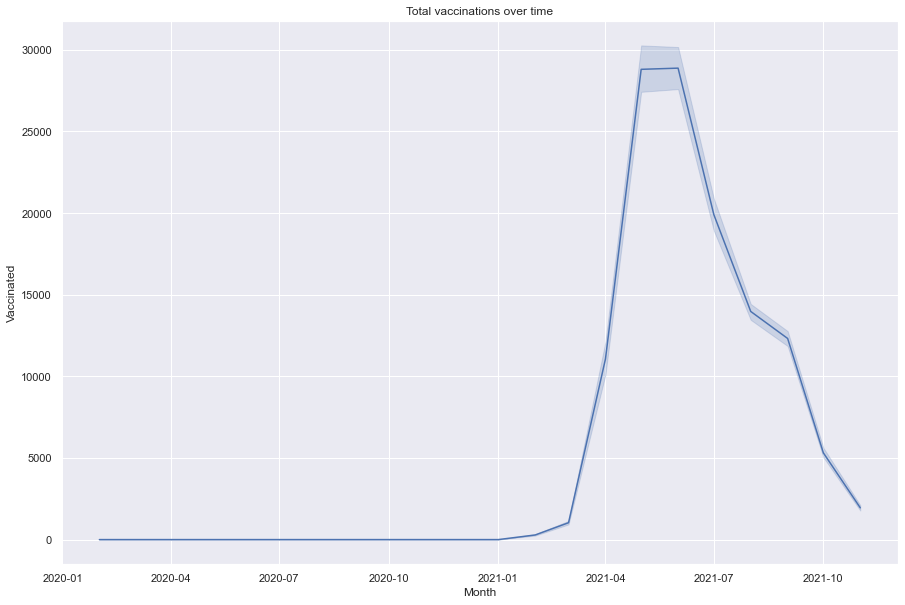

In [62]:
# Examine vaccinations over time for all regions
all_vac= sns.lineplot(x="Month", y="Vaccinated", data=covid_clean)
all_vac.set_title("Total vaccinations over time")

In [63]:
# Use groupby() to determine total vaccinations by region and sort values
covid_clean.groupby("Province/State")[["Vaccinated"]].sum().sort_values("Vaccinated")

,Vaccinated
Province/State,
"Saint Helena, Ascension and Tristan da Cunha",2242421
Others,2466669
Bermuda,2690908
Turks and Caicos Islands,2915136
Channel Islands,3139385
Cayman Islands,3363624
Falkland Islands (Malvinas),3587869
Isle of Man,4036345
Anguilla,4709072


Text(0.5, 1.0, 'Total vaccinations by region')

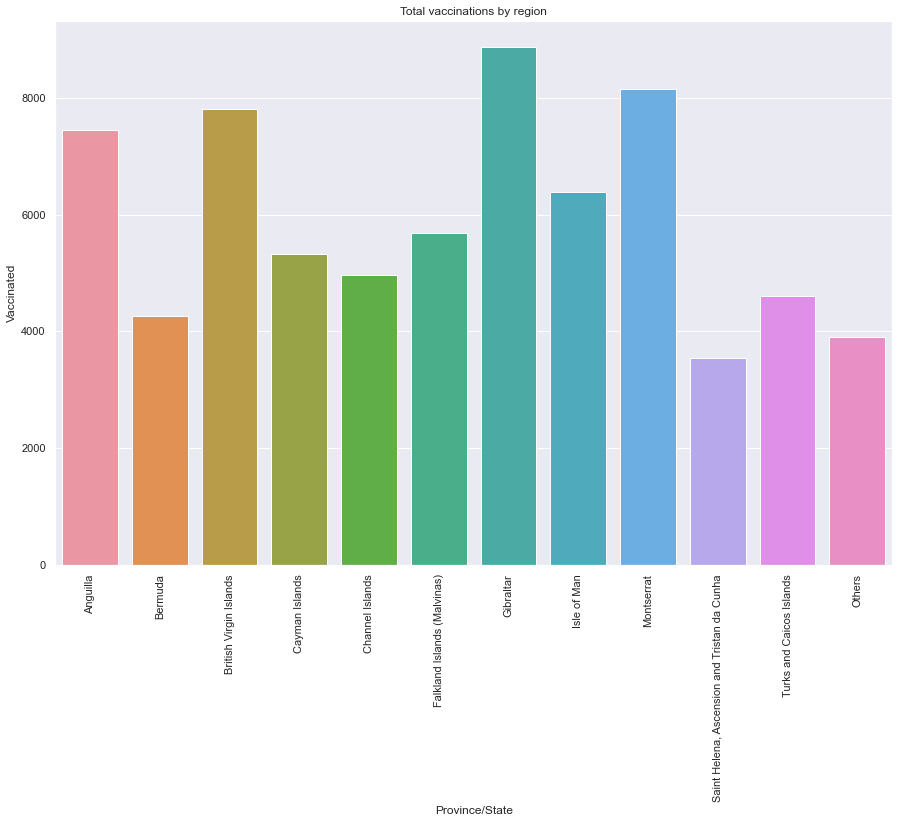

In [64]:
# Create visual represenation of data
sns.barplot(x="Province/State", y="Vaccinated", data=covid_clean, ci=None)
plt.xticks(rotation=90)
plt.title("Total vaccinations by region")

### Area that has the greatest number of recoveries

In [65]:
# Use groupby() to determine recovery differences between regions and sort values
covid_clean.groupby("Province/State")[["Recovered"]].sum().sort_values("Recovered")

,Recovered
Province/State,
"Saint Helena, Ascension and Tristan da Cunha",1135.0
Others,4115.0
Montserrat,6376.0
Anguilla,12708.0
Falkland Islands (Malvinas),14754.0
British Virgin Islands,64359.0
Cayman Islands,152052.0
Isle of Man,328319.0
Bermuda,363999.0


Text(0.5, 1.0, 'Total recoveries by Province/State')

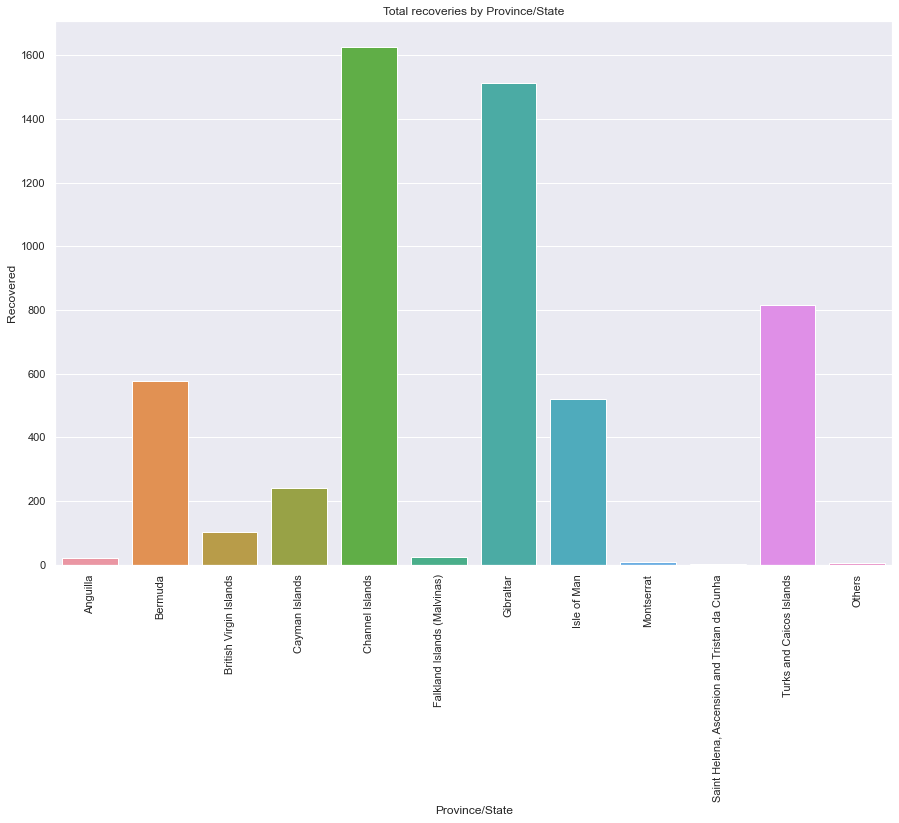

In [66]:
# Visualise recoveries by region
sns.barplot(x="Province/State", y="Recovered", data=covid_clean, ci=None)
plt.xticks(rotation=90)
plt.title("Total recoveries by Province/State")

In [67]:
# Total recovery numbers by month - absolute
covid_clean.groupby("Month")[["Recovered"]].sum().sort_values("Month")

,Recovered
Month,
2020-02-01,0.0
2020-03-01,124.0
2020-04-01,2100.0
2020-05-01,15593.0
2020-06-01,33119.0
2020-07-01,38969.0
2020-08-01,43510.0
2020-09-01,47033.0
2020-10-01,62634.0


<AxesSubplot:xlabel='Month', ylabel='Recovered'>

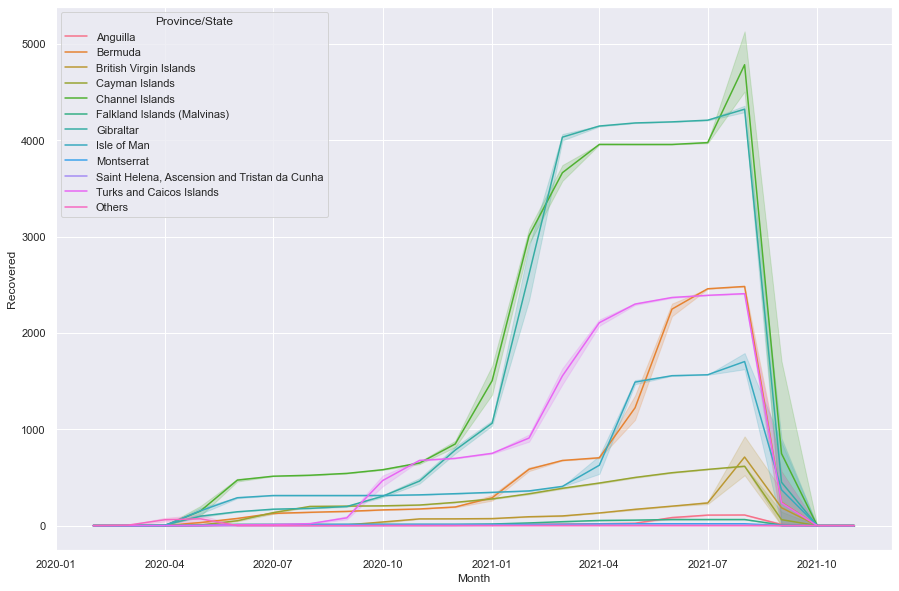

In [68]:
# Visualise recoveries by months and regions - absolute
sns.lineplot(x="Month", y="Recovered", hue="Province/State", data=covid_clean)

In [69]:
# Analyse recoveries in relation to case numbers
# Create new variable to get percentage recovered vs cases
covid_clean['Recovery %'] = ((covid_clean['Recovered'])/(covid_clean['Cases'])) * 100
print(covid_clean.head())
print(covid_clean.tail())

  Province/State  Country/Region       Date  Deaths  Cases  Recovered  \
0       Anguilla  United Kingdom 2020-01-22     0.0    0.0        0.0   
1       Anguilla  United Kingdom 2020-01-23     0.0    0.0        0.0   
2       Anguilla  United Kingdom 2020-01-24     0.0    0.0        0.0   
3       Anguilla  United Kingdom 2020-01-25     0.0    0.0        0.0   
4       Anguilla  United Kingdom 2020-01-26     0.0    0.0        0.0   

   Hospitalised  Vaccinated  First Dose  Second Dose      Month  \
0           0.0           0           0            0 2020-02-01   
1           0.0           0           0            0 2020-02-01   
2           0.0           0           0            0 2020-02-01   
3           0.0           0           0            0 2020-02-01   
4           0.0           0           0            0 2020-02-01   

   Vaccination Difference  First Dose %  Second Dose %  Recovery %  
0                       0           NaN            NaN         NaN  
1                   

In [70]:
# Total recovery numbers by region - relative
covid_clean.groupby("Province/State")[["Recovery %"]].sum().sort_values("Recovery %")

,Recovery %
Province/State,
Others,502.310279
"Saint Helena, Ascension and Tristan da Cunha",33008.333333
Turks and Caicos Islands,37587.129128
British Virgin Islands,38277.172732
Bermuda,40526.329686
Channel Islands,41268.921785
Montserrat,41448.736743
Cayman Islands,41859.589563
Isle of Man,42236.831055


<AxesSubplot:xlabel='Month', ylabel='Recovery %'>

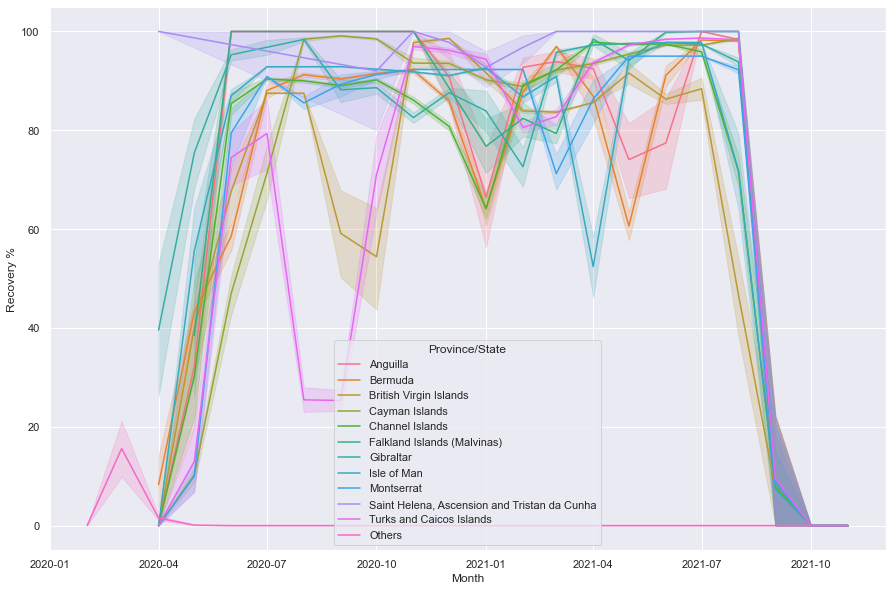

In [71]:
# Visualise recoveries by months and regions - relative
sns.lineplot(x="Month", y="Recovery %", hue="Province/State", data=covid_clean)

### Analyse whether deaths have been increasing across all regions or whether peak has been reached

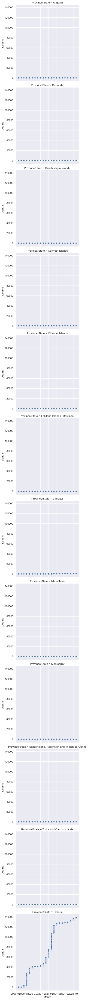

In [72]:
# Visualise deaths by months and regions
sns.relplot(x="Month", y="Deaths", row="Province/State", data=covid_clean)

<AxesSubplot:xlabel='Province/State', ylabel='Deaths'>

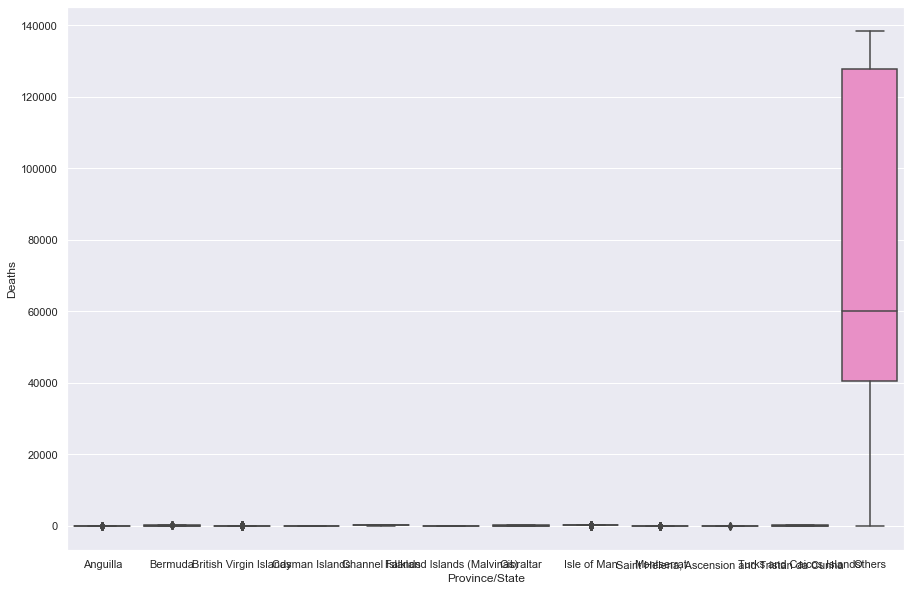

In [73]:
# Check for outliers in Deaths
sns.boxplot(x="Province/State", y= "Deaths", data=covid_clean)

In [74]:
# Filter to remove Others
covid_clean_filter = covid_clean[covid_clean['Province/State'] != 'Others']
print(covid_clean_filter.info)

<bound method DataFrame.info of                                     Province/State  Country/Region       Date  \
0                                         Anguilla  United Kingdom 2020-01-22   
1                                         Anguilla  United Kingdom 2020-01-23   
2                                         Anguilla  United Kingdom 2020-01-24   
3                                         Anguilla  United Kingdom 2020-01-25   
4                                         Anguilla  United Kingdom 2020-01-26   
5                                         Anguilla  United Kingdom 2020-01-27   
6                                         Anguilla  United Kingdom 2020-01-28   
7                                         Anguilla  United Kingdom 2020-01-29   
8                                         Anguilla  United Kingdom 2020-01-30   
9                                         Anguilla  United Kingdom 2020-01-31   
10                                        Anguilla  United Kingdom 2020-02-01

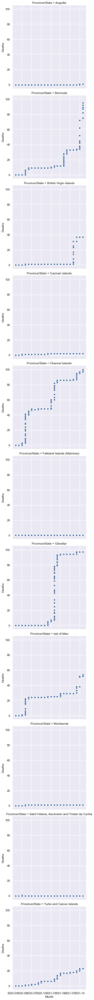

In [75]:
#  Re-run plot with Others removed
sns.relplot(x="Month", y="Deaths", row="Province/State", data=covid_clean_filter)

In [76]:
# Look at regions individually
# Create separate DataFrames for each of the regions
Gibraltar = covid_clean[covid_clean['Province/State'] == 'Gibraltar']
Anguilla = covid_clean[covid_clean['Province/State'] == 'Anguilla']
Bermuda = covid_clean[covid_clean['Province/State'] == 'Bermuda']
British_Virgin_Islands = covid_clean[covid_clean['Province/State'] == 'British Virgin Islands']
Cayman = covid_clean[covid_clean['Province/State'] == 'Cayman Islands']
Channel = covid_clean[covid_clean['Province/State'] == 'Channel Islands']
Falkland = covid_clean[covid_clean['Province/State'] == 'Falkland Islands (Malvinas)']
Isle_of_Man = covid_clean[covid_clean['Province/State'] == 'Isle of Man']
Montserrat = covid_clean[covid_clean['Province/State'] == 'Montserrat']
St_Helena = covid_clean[covid_clean['Province/State'] == 'Saint Helena, Ascension and Tristan da Cunha']
Turks_Caicos = covid_clean[covid_clean['Province/State'] == 'Turks and Caicos Islands']
Others = covid_clean[covid_clean['Province/State'] == 'Others']

Text(0.5, 1.0, 'Gibraltar')

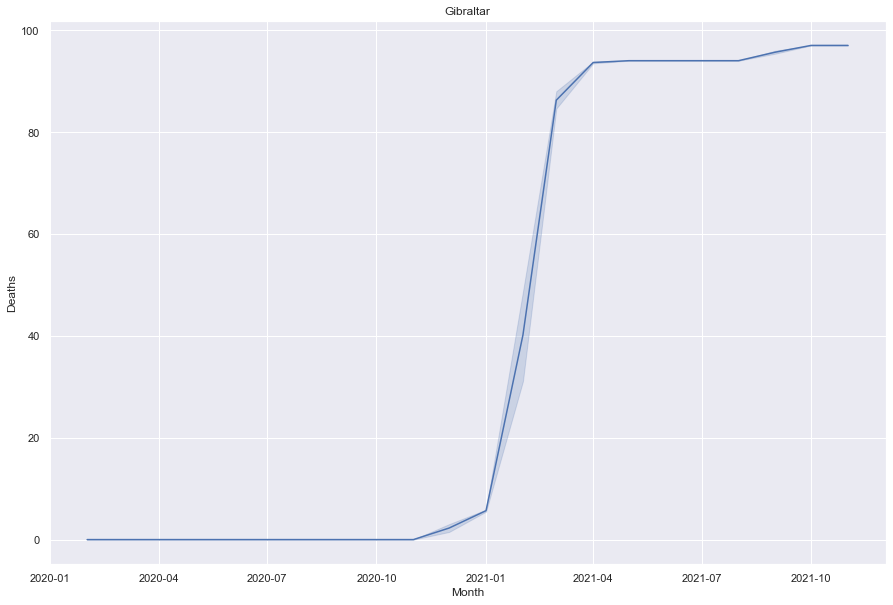

In [77]:
#Deaths - Gibraltar
gibraltar = sns.lineplot(x="Month", y="Deaths", data=Gibraltar)
gibraltar.set_title("Gibraltar")

Text(0.5, 1.0, 'Anguilla')

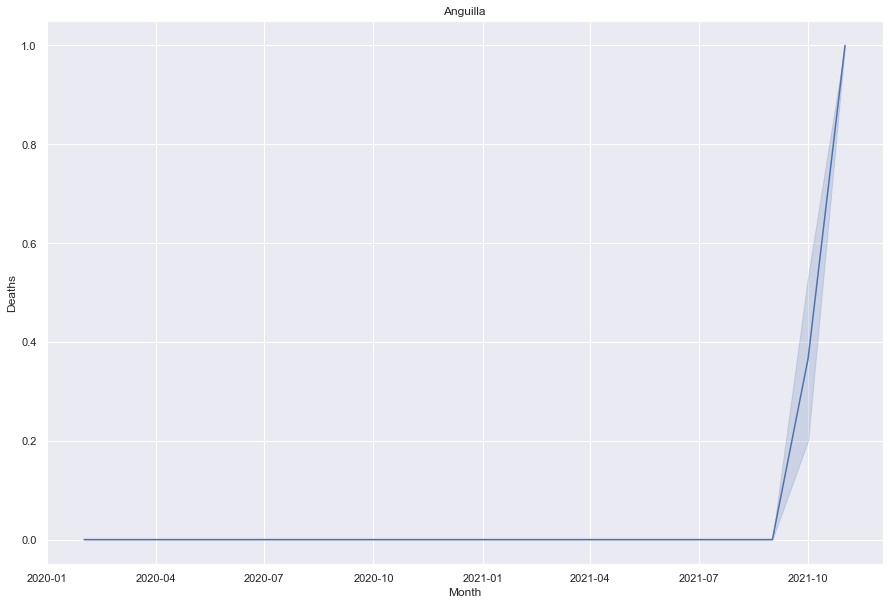

In [78]:
#Deaths - Anguilla
anguilla = sns.lineplot(x="Month", y="Deaths", data=Anguilla)
anguilla.set_title("Anguilla")

Text(0.5, 1.0, 'Bermuda')

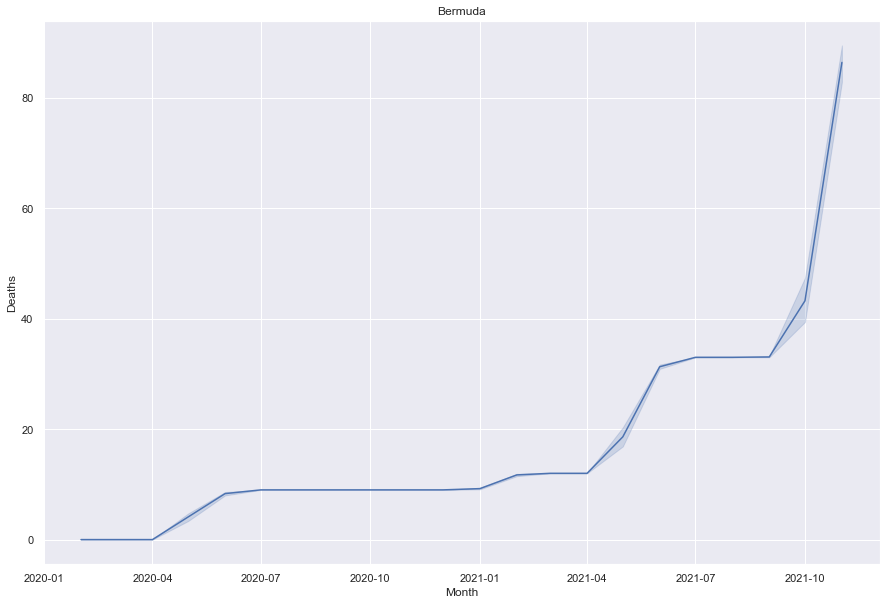

In [79]:
#Deaths - Bermuda
bermuda = sns.lineplot(x="Month", y="Deaths", data=Bermuda)
bermuda.set_title("Bermuda")

Text(0.5, 1.0, 'British Virgin Islands')

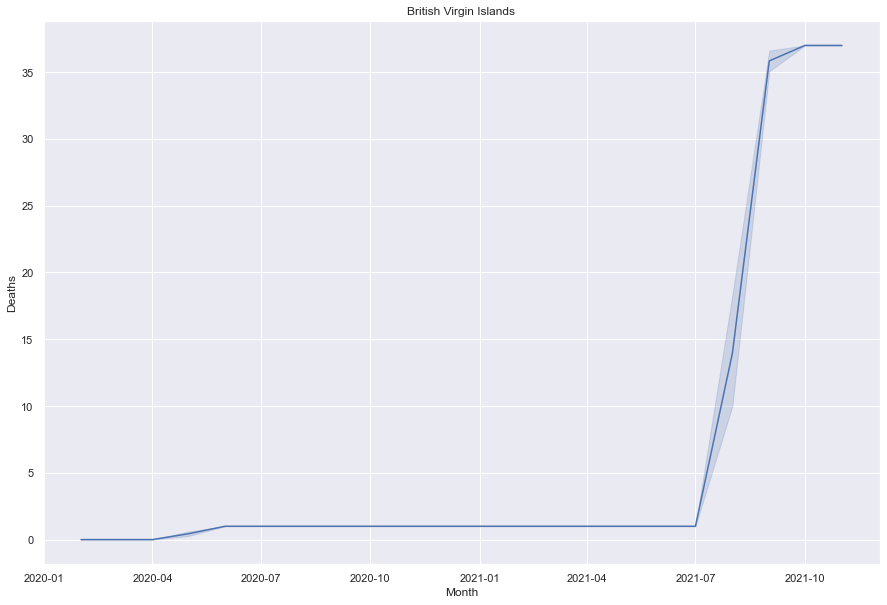

In [81]:
#Deaths - British Virgin Islands
BVI = sns.lineplot(x="Month", y="Deaths", data=British_Virgin_Islands)
BVI.set_title("British Virgin Islands")

Text(0.5, 1.0, 'Cayman Islands')

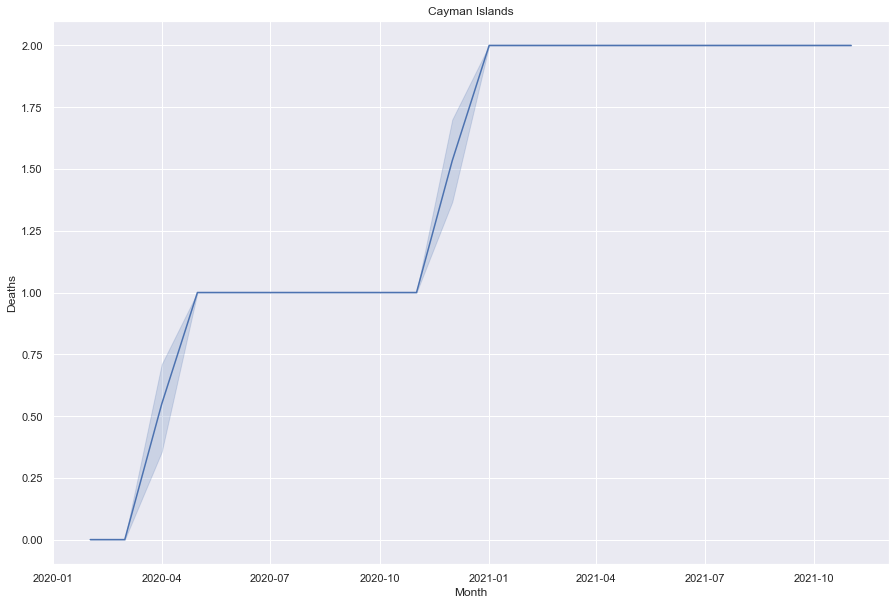

In [82]:
#Deaths - Cayman Islands
cayman = sns.lineplot(x="Month", y="Deaths", data=Cayman)
cayman.set_title("Cayman Islands")

Text(0.5, 1.0, 'Channel Islands')

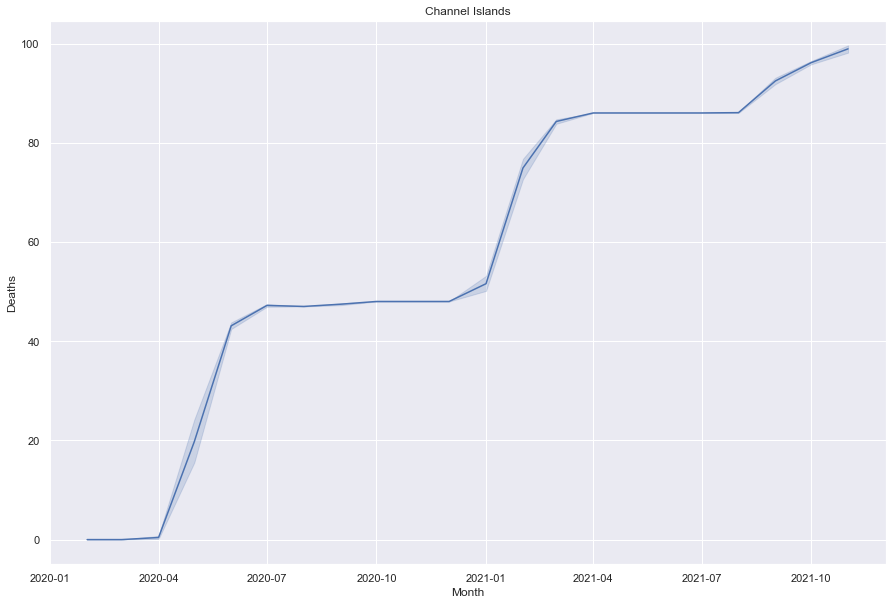

In [83]:
#Deaths - Channel Islands
channel = sns.lineplot(x="Month", y="Deaths", data=Channel)
channel.set_title("Channel Islands")

Text(0.5, 1.0, 'Falkland Islands')

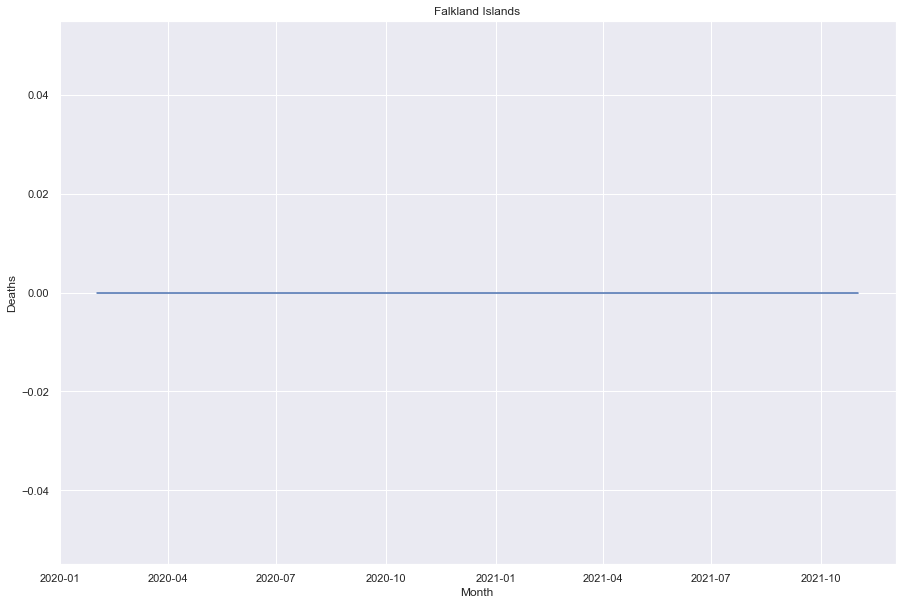

In [84]:
#Deaths - Falkland Islands
falkland = sns.lineplot(x="Month", y="Deaths", data=Falkland)
falkland.set_title("Falkland Islands")

Text(0.5, 1.0, 'Isle of Man')

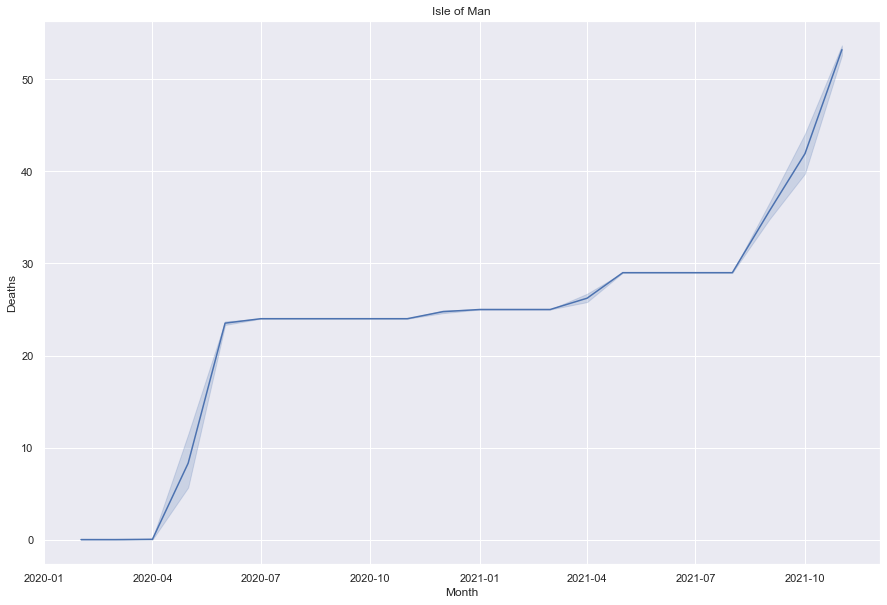

In [85]:
#Deaths - Isle of Man
isle = sns.lineplot(x="Month", y="Deaths", data=Isle_of_Man)
isle.set_title("Isle of Man")

Text(0.5, 1.0, 'Montserrat')

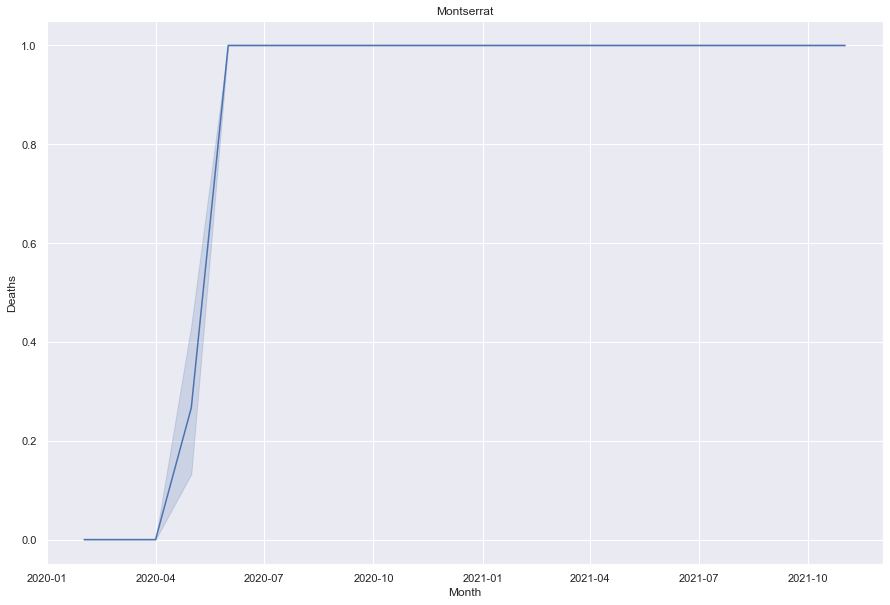

In [86]:
#Deaths - Montserrat
montserrat = sns.lineplot(x="Month", y="Deaths", data=Montserrat)
montserrat.set_title("Montserrat")

Text(0.5, 1.0, 'St Helena, Ascension and Tristan da Cunha')

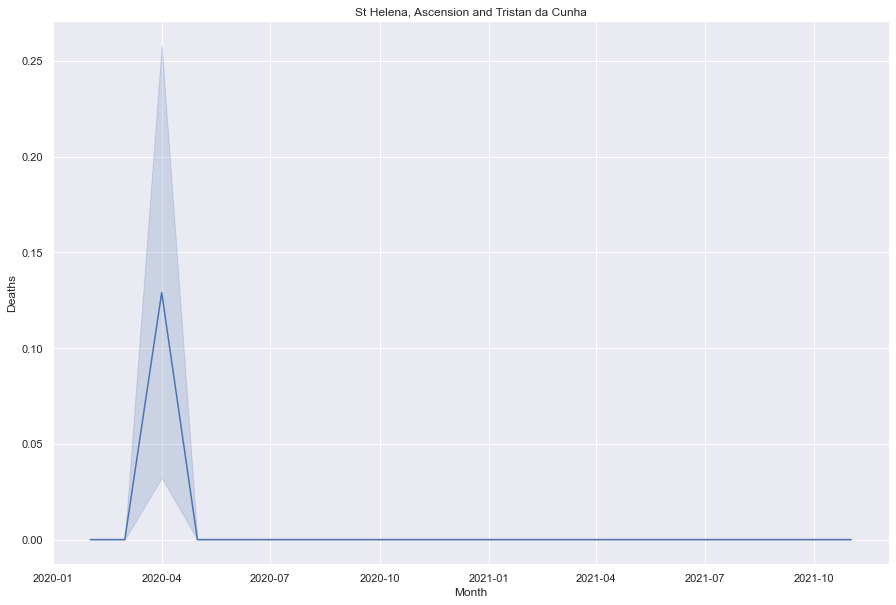

In [87]:
#Deaths - Saint Helena, Ascension and Tristan da Cunha
sthelena = sns.lineplot(x="Month", y="Deaths", data=St_Helena)
sthelena.set_title("St Helena, Ascension and Tristan da Cunha")

Text(0.5, 1.0, 'Turks and Caicos')

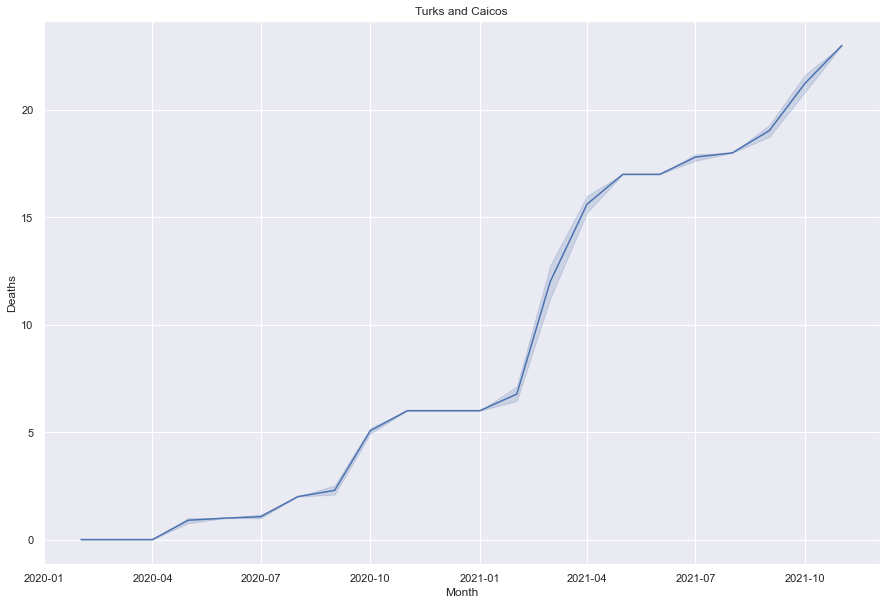

In [88]:
#Deaths - Turks and Caicos
turks = sns.lineplot(x="Month", y="Deaths", data=Turks_Caicos)
turks.set_title("Turks and Caicos")

Text(0.5, 1.0, 'Others')

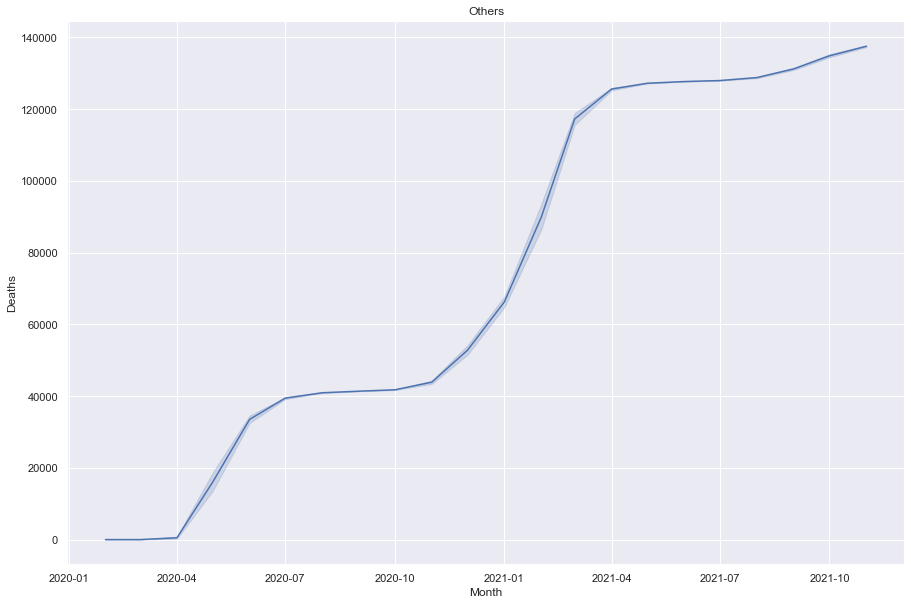

In [89]:
#Deaths - Others
others = sns.lineplot(x="Month", y="Deaths", data=Others)
others.set_title("Others")

### Compare hospitalisation numbers over time

<AxesSubplot:xlabel='Month', ylabel='Hospitalised'>

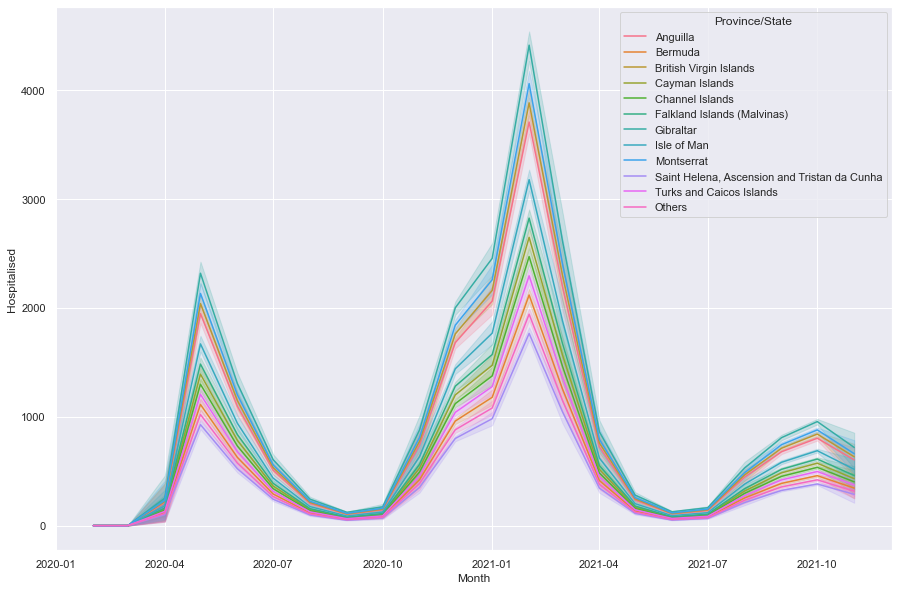

In [90]:
# Look at regions together
sns.lineplot(x="Month", y="Hospitalised", hue="Province/State", data=covid_clean)

#### Observations

Total vaccinations: See peak in total vaccinations in spring 2021, with smaller peak in late summer/early autumn 2021. At regional level see that Gibraltar, Montserrat, and the British Virgin Islands have the highest number of vaccinations
     
First dose vs second dose:
     - See an interesting trend across all regions when we compare peaks for the first dose and second dose. As the first dose goes down around April 2021, we start to see a peak in the number of second doses – which makes sense given the timing between doses. See small peak in second doses about a month or two following peak in first doses in July 2021
     - Absolute numbers: Gibraltar, Montserrat, and the British Virgin Islands have the highest difference between those who have received a first dose but no second dose
     - Relative percentage of those who received a first dose but haven’t yet received a second dose shows that all regions are equal
     - Regions nearly identical in terms of first dose percentage over time
     
Recoveries
     - All of the regions follow a similar trend over time in terms of recoveries, with peaks in the late summer/early autumn and sharp drops
     - In terms of absolute numbers, the Channel Islands and Gibraltar lead in the number of total recoveries
     - In terms of relative numbers, Gibraltar, the Falkland Islands, and Anguilla have the highest numbers of recoveries relative to overall case numbers
     
Deaths: 3 distinct trends
     - rising: Anguilla,Bermuda, Channel Islands, Turks and Caicos, Isle of Man
     - stable: British Virgin Islands, Montserrate, Cayman Islands, Others, Gibraltar
     - flat or peaked: Falkland Islands, St Helena, Ascension and Tristan da Cunha  
     
Hospitalisations: We can see that all regions followed a very similar pattern over time, with hospitalisations reaching their highest peak around February 2021. While there has been a slight peak in October 2021, hospitalisations seem to be declining in all regions

Improvements/further analysis:
     - Should note when vaccinations were rolled out and if they were rolled out evenly across regions
     - Need to take into account relative size of each region
     - Total vaccinations: These are absolute numbers and it may be worth looking into whether this data corresponds with population differences across the various regions

# 5) Assignment activity 5: External data: [Analyse the Twitter data](https://fourthrev.instructure.com/courses/313/pages/assignment-activity-5-analyse-the-twitter-data?module_item_id=21383)
In the next section, you were supplied with a sample file and the question was asked to determine whether there are additional #tags or keywords that could potentially provide insights into your covid analysis. While the sample set is limited, you were asked to review the provided file and demonstrate the typical steps and make recommendations regarding future use of similar datasets to provide richer insights.

#### 5.1) Report expectations:
- Demonstrate basic ability to work with Twitter data
- Search for hash-tags or keywords
- Create dataframes and visualisations
- Note observations

In [91]:
# Import the tweet dataset (`tweets_2.csv`)
tweets_2 = pd.read_csv("tweets_2.csv")

In [92]:
# Explore the data: info(), head()
print(tweets_2.info())
print(tweets_2.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 29 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   created_at                 100 non-null    object 
 1   id                         100 non-null    int64  
 2   id_str                     100 non-null    int64  
 3   text                       100 non-null    object 
 4   truncated                  100 non-null    bool   
 5   entities                   100 non-null    object 
 6   metadata                   100 non-null    object 
 7   source                     100 non-null    object 
 8   in_reply_to_status_id      8 non-null      float64
 9   in_reply_to_status_id_str  8 non-null      float64
 10  in_reply_to_user_id        11 non-null     float64
 11  in_reply_to_user_id_str    11 non-null     float64
 12  in_reply_to_screen_name    11 non-null     object 
 13  user                       100 non-null    object 


In [93]:
# Explore the structure, count the tweets, get the elements of interest
print(tweets_2.shape)
print(tweets_2.dtypes)
print(len(tweets_2))

(100, 29)
created_at                    object
id                             int64
id_str                         int64
text                          object
truncated                       bool
entities                      object
metadata                      object
source                        object
in_reply_to_status_id        float64
in_reply_to_status_id_str    float64
in_reply_to_user_id          float64
in_reply_to_user_id_str      float64
in_reply_to_screen_name       object
user                          object
geo                           object
coordinates                   object
place                         object
contributors                 float64
is_quote_status                 bool
retweet_count                  int64
favorite_count                 int64
favorited                       bool
retweeted                       bool
lang                          object
possibly_sensitive            object
quoted_status_id             float64
quoted_status_id_str        

In [94]:
# Create a dataframe with the text only
tweets_text = tweets_2["text"]
tweets_text

0     @Johnrashton47 When #diabetes has been the big...
1     Disturbing figures from @fsb_policy @indparltr...
2     NEW: #Stormont MLAs voted 57 ~ 25 to extend Do...
3     I'm do sick of coming on twitter to see the sa...
4     The rollout of new #COVID19 #Booster jabs to #...
5     Trying to keep a mask in inside to see if we c...
6     Dear @sajidjavid are NHS staff meant to do twi...
7     #breaking #ShanghaiDisneyland is closed from t...
8     Just cancelled our (thankfully cheap &amp; che...
9     Once again out of dozens of customers I was th...
10    Huge thanks to everyone involved in bringing t...
11    The set is up! Production starting this week!!...
12    Last week committee mertings on "The Frauds ar...
13    Thank You @aimeeeieio ♥️♥️♥️ #COVID19 goodies ...
14    Covid has finally got me and about of half the...
15    God almighty I need to paint the entire lounge...
16    The number of people in #hospital with #COVID1...
17    Most of the remaining legal #COVID19 restr

In [95]:
# Loop through the messages and build a list of values containing the #-symbol
# Create empty list to store extracted data
hash_list = [] 

# For loop will iterate through each row in tweets_text to split words apart and store words with # in hash_list
for row in tweets_text:
    word_list = row.strip().split()
    for word in word_list:
        if "#" in word:
            hash_list.append(word)
        else:
            pass

# Display first 30 records in hash_list
print(hash_list[0:29])

['#diabetes', '#COVID19', '#Stormont', '#covid19', '#borisOut', '#BrexitDisaster', '#Trans', '#COVID19', '#COVID19', '#Booster', '#vulnerable', '#IsleofMan', '#COVID19', '#breaking', '#ShanghaiDisneyland', '#COVID19', '#China…', '#COVID19', '#StPatricksDay…', '#Television', '#University', '#UniversityofWestminster', '#competition…', '#COVID19', '#hmrc', '#banking…', '#COVID19', '#CovidIsNotOver', '#hospital']


In [96]:
# Convert hash_list to Pandas DataFrame
hash_df = pd.DataFrame(hash_list, columns= ['Hash_tag'])
hash_df

,Hash_tag
0,#diabetes
1,#COVID19
2,#Stormont
3,#covid19
4,#borisOut
5,#BrexitDisaster
6,#Trans
7,#COVID19
8,#COVID19
9,#Booster


In [97]:
# Convert hash_df to DataFrame with value counts
hash_counts = hash_df.value_counts().reset_index()
hash_counts.columns= ['Hash_tag', 'Counts']
hash_counts

,Hash_tag,Counts
0,#COVID19,53
1,#covid19,7
2,#CovidIsNotOver,3
3,#coronavirus,3
4,#Brexit,2
5,#covid,2
6,#Partygate,2
7,#Athens,1
8,#diabetes,1
9,#covid19UK,1


In [98]:
# Filter and sort
# Create new DataFrame only containing counts  > 2
hash_filtered = hash_counts[hash_counts['Counts'] > 2]
hash_filtered

,Hash_tag,Counts
0,#COVID19,53
1,#covid19,7
2,#CovidIsNotOver,3
3,#coronavirus,3


<AxesSubplot:xlabel='Hash_tag', ylabel='Counts'>

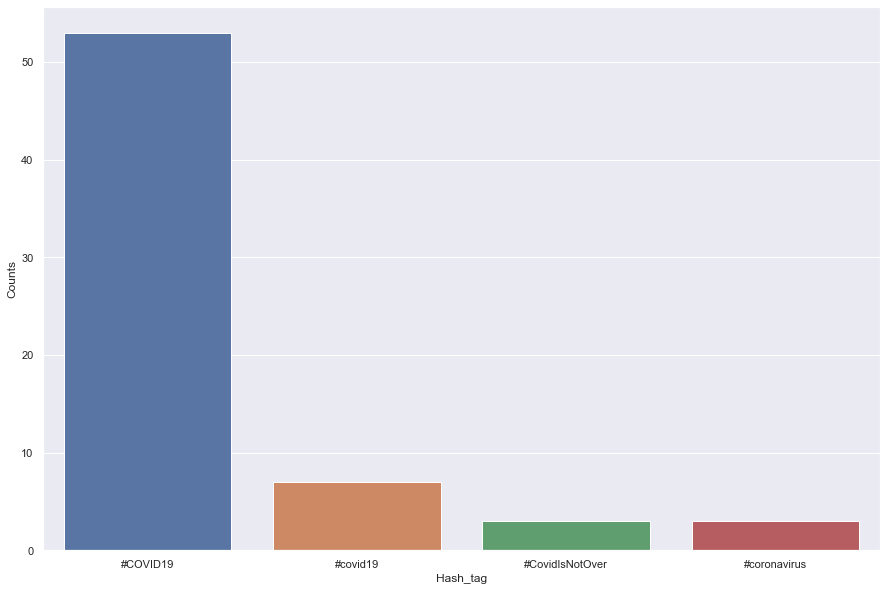

In [99]:
# Plot
sns.barplot(x="Hash_tag", y="Counts", data=hash_filtered)

#### Discuss whether external data could potentially be used and whether it is a viable solution to pursue. Discuss your assumptions and suggestions. 

Points to consider:
- What insights can be gained from the data?
- What are the advantages and disadvantages of using external data?
- How would you suggest using external data in the project?

 - "#COVID19" was overwhelmingly the top cited hashtag the day that the data was scraped from Twitter. However, this does not give us much insight into other details of the tweet (e.g. sentiment of the tweet, themes, etc.)
 - Advantages of using external data: 
     - Can provide more context around data and present more of a "story" of what might be going on to inform better business decisions
     - Could present alternative explanations and ideas not previously considered
 - Disadvantages of using external data: 
     - Ethical implications involved in avoiding misuse of data, plagiarism, and identity theft
     - Could be more resource-intensive to collect and analyse external data
 - Suggestions for use of external data in project:
     - Introduce data that explains more about the population of each of the regions
     - Introduce data about COVID restrictions in each of the regions
     - Introduce data on vaccine introduction in each of the regions
     - Examine Twitter data more closely for tweets associated with "#COVID19"

# 6) Assignment activity 6: [Perform time-series analysis](https://fourthrev.instructure.com/courses/313/pages/assignment-activity-6-perform-time-series-analysis?module_item_id=22584)

#### 6.1) Report expectations:
- Demonstrate using external function and interpret results
- Note observations

In [100]:
# Libraries and settings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

In [101]:
# Load and select relevant subset of the data.
# Make sure to change the relative path to function in your environment.
ds1 = pd.read_csv('covid_19_uk_cases.csv')
ds2 = pd.read_csv('covid_19_uk_vaccinated.csv')

sample = ds1[['Province/State','Date','Hospitalised']]

In [102]:
# Select data for a specific province
sample_ci = sample[sample['Province/State'] == "Channel Islands"]

In [103]:
# Define function to plot moving averages
def plot_moving_average(series, window, plot_intervals=False, scale=1.96):
    
    # Create a rolling window to calculate the rolling mean using the series.rolling function
    rolling_mean = series.rolling(window=window).mean()
    
    # Declare the dimensions for the plot, plot name and plot the data consisting of the rolling mean from above. 
    plt.figure(figsize=(18,4))
    plt.title('Moving average\n window size = {}'.format(window))
    plt.plot(rolling_mean, 'g', label='Simple moving average trend')

    
    # Plot confidence intervals for smoothed values
    if plot_intervals:
        
        # Calculate the mean absolute square 
        mae = mean_absolute_error(series[window:7], rolling_mean[window:])
        
        # Calculate the standard deviation using numpy's std function
        deviation = np.std(series[window:7] - rolling_mean[window:7])
        
        # Calculate the upper and lower bounds 
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        
        # Name and style upper and lower bound lines and labels 
        plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
        plt.plot(lower_bound, 'r--')
    
    # Plot the actual values for the entire timeframe.
    plt.plot(series[window:7], label='Actual values')
    plt.grid(True)

In [104]:
# Define function to calculate the mean absolute error
def mean_absolute_error(a, b): return abs(b - a)

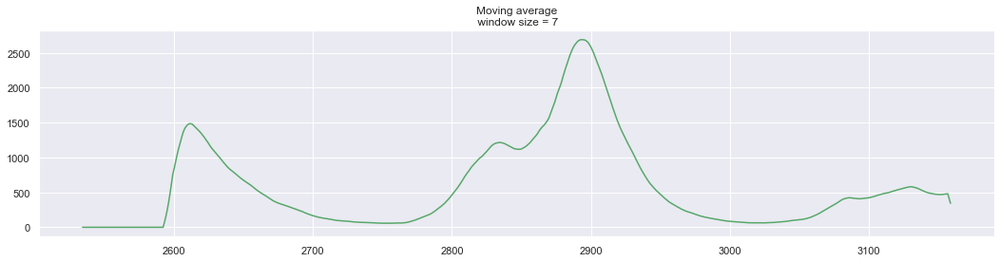

In [105]:
# Demonstrate the use of the function to plot moving averages
plot_moving_average(sample_ci, 7)

In [106]:
# Return top three days with biggest difference between daily value and rolling 7-day mean
s = sample_ci.copy()
s_rolling = s['Hospitalised'].rolling(window=7).mean()
s['error'] = mean_absolute_error(s['Hospitalised'][7:], s_rolling[7:])
s.sort_values('error', ascending=False).head(3)

,Province/State,Date,Hospitalised,error
2593,Channel Islands,2020-03-27,509.0,436.285714
2594,Channel Islands,2020-03-28,579.0,423.571429
2595,Channel Islands,2020-03-29,667.0,416.285714


#### Can you offer some insight into the meaning of the code and the output?

The consultant created the earlier function to calculate a moving average. The moving average technique is used to smooth the seasonal effects and irregularities in the data. An upward trend in a moving average could signify an upswing in hospitalisations while a downward trend could be a sign of decline. Calculating the average eliminates some of the randomness in the data, leaving a smooth trend-cycle. 

The analyst may have created the code to return the top three days with the biggest difference between the daily value and the rolling 7-day mean in order to show irregularities that would have been missed in the moving average function. This information could be useful in interpreting the data since one of the down sides of using a moving average is that it can flatten the curve too much if the window is too broad. 

**Question 1**: We have heard of both qualitative and quantitative data from the previous consultant. What are the differences between the two? Should we use only one or both of these types of data and why? How can these be used in business predictions? Could you provide examples of each?

**Question 2**: We have also heard a bit about the need for continuous improvement. Why should this be implemented, it seems like a waste of time. Why can’t we just implement the current project as it stands and move on to other pressing matters?

**Question 3**: As a government, we adhere to all data protection requirements and have good governance in place. We only work with aggregated data and therefore will not expose any personal details. We have covered everything from a data ethics standpoint, correct? There’s nothing else we need to implement from a data ethics perspective, right?

#### Question 1:

Qualitative data is based on groups, interepretation, and description. Examples include gender, binary data, ranking, and name. Quantitative data is numeric and portrayed by ordinal, interval or ration scales and lends itself to statistical manipulation. Examples include height, distance, temperature, and speed. 

Qualitative data can be used in forecasting techniques like the Delphi method, market research, and panel consensus. Qualitative methods are useful when you have insufficient historic data to make statistically relevant conclusions. these methods are useful in providing short-term predictions for companies, products, and services and can be triangulated with statistical methods to guide modelling.

Quantitative data can be used in a number of time series, causal, and correlational/observational forecasting techniques. These approaches are concerned only with numerical data that is easily quantifiable and is effective when there is accurate historical data available to predict the probability of future events. Quantitative methods involve learning patterns from data to help better understand how a process works or to predict future events. 

#### Question 2:

Continuous improvement can lead to small but impactful changes that can help gather more reliable insights to inform business decision-making. These changes enable organisations to stay ahead of the competition and achieve objectives and, in turn, can help attract new customers and improve the experience of existing ones. 

#### Question 3:

Data ethics should not be ignored and apply to any data practices the business performs. For instance, aggregated data can still be misused or manipulated to reflect a biased point of view. Data ethics will help safeguard against fraud, misuse, unauthorised use, and phishing schemes.